
# Predicción de Capacidades Hospitalarias con Variables Meteorológicas y Ambientales en Medellín

**Objetivo del proyecto**  
Este trabajo tiene como objetivo desarrollar un modelo para la predicción de capacidades hospitalarias en la ciudad de Medellín, utilizando variables meteorológicas y ambientales proporcionadas por el SIATA, así como registros de atención en salud obtenidos de la base de datos RIPS Medellín.

**Fecha**: Mayo 2025  
**Autores**: Juan José Naranjo Velasquez, Kenneth David Leonel Triana 

**Nota**: Trabajo de graduación para optar al título de Especialización en Analítica y Ciencia de Datos  
**Universidad de Antioquia**


## 1) Importe de librerías

In [109]:
# Carga de librerias
from IPython.display import display
import subprocess as sp
import numpy as np
import pandas as pd
import os
import glob
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib import rcParams
from sklearn.metrics import r2_score
from statsmodels.tsa.seasonal import seasonal_decompose
from pylab import rcParams
import random
import time
from datetime import datetime
import datetime
from scipy import stats
import statsmodels.api as sm
import holidays
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler , MinMaxScaler, OrdinalEncoder
from sklearn.model_selection import train_test_split
#Modelos
from sklearn import svm
from sklearn.metrics import mean_squared_error, confusion_matrix, ConfusionMatrixDisplay
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
import pickle
import joblib
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
#PCA
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import make_scorer
#ANOVA
from scipy.stats import f_oneway
#SHAP VALUES
import shap
#Lime
from lime.lime_tabular import LimeTabularExplainer

## 2) Funciones Cargue datos

Nota:  Los datos fueron tomados del SIATA Medellín y de los datos médicos RIPS Medellín

In [110]:
# Configurar parametros de pandas y matplotlib
pd.set_option('display.precision', 4)
%config IPCompleter.greedy=True
%matplotlib inline

params = {}
plt.rcParams.update(params)
params = {
           'legend.fontsize': 20,
           'legend.handlelength': 2,
           'axes.titlesize':'20',
           'xtick.labelsize':'20',
           'ytick.labelsize':'20'
         }

matplotlib.rcParams.update(params)

In [111]:

def unificar_archivos_excel(carpeta_principal, archivo_salida):
    # Lista para almacenar todos los dataframes
    dfs = []
    
    # Recorre todos los archivos en la carpeta principal y subcarpetas
    for root, dirs, files in os.walk(carpeta_principal):
        for file in files:
            if file.endswith('.csv') or file.endswith('.xlsx'):  # Verifica si es un archivo Excel
                archivo_actual = os.path.join(root, file)
                print (f"El nombre de archivo es : {archivo_actual}") #El nombre de archivo es : data/raw/calidad\estacion_data_calidadaire_83_20230701_20240930.csv 
                
                #Se guarda el numero de la estación que pertenece el archivo
                estacion = file.split('_')[3]
                print(f"Estación  numero: {estacion}")  # Estación : 83 
                try:
                    # Lee el archivo Excel y agrega su contenido a la lista
                    df = pd.read_csv(archivo_actual)
                    #Pasar las columnas a minusculas
                    df.columns = df.columns.str.lower()
                    # Agregar una columna con el código de la estación al DataFrame
                    df['codigo'] = estacion  # Agrega una columna con el número de la estación
                    dfs.append(df)
                except Exception as e:
                    print(f"No se pudo leer el archivo {archivo_actual}: {e}")

    # Si hay archivos leídos, unificarlos en un solo DataFrame
    if dfs:
        df_unificado = pd.concat(dfs, ignore_index=True)
        
        # Guardar el DataFrame unificado en un archivo Excel
        df_unificado.to_csv(archivo_salida, index=False)
        print(f"Archivos unificados en {archivo_salida}")
    else:
        print("No se encontraron archivos Excel.")



In [112]:
def categoriaCodigoSerial(codigo):
    """
    Función para definir la categoría de calidad del aire
    args:   codigo = código serial de calidad del aire
    In[0]: código serial
    Out[0]: categoría de calidad del aire
    """
    if codigo == 84 or codigo == 198:
        return 'Estacion Poblado'
    elif codigo == 86 or codigo == 68:
        return 'Estacion Aranjuez'
    elif codigo == 83 or codigo == 197 or codigo == 9:
        return 'Estacion Belen'

Usar funciones cargue datos SIATA

In [113]:
# Usar el script
carpeta_calidad = 'data/raw/calidad'  # Ruta a la carpeta principal
archivo_calidad = 'data/stage/unificado_calidad.csv'  # Nombre del archivo Excel de salida
df_calidad = unificar_archivos_excel(carpeta_calidad, archivo_calidad)

carpeta_humedad = 'data/raw/humedad'  # Ruta a la carpeta principal
archivo_humedad = 'data/stage/unificado_humedad.csv'  # Nombre del archivo Excel de salida
df_humedad = unificar_archivos_excel(carpeta_humedad, archivo_humedad)

carpeta_precipitacion = 'data/raw/precipitacion'  # Ruta a la carpeta principal
archivo_precipitacion = 'data/stage/unificado_precipitacion.csv'  # Nombre del archivo Excel de salida
df_precipitacion = unificar_archivos_excel(carpeta_precipitacion, archivo_precipitacion)

carpeta_presion = 'data/raw/presion'  # Ruta a la carpeta principal
archivo_presion = 'data/stage/unificado_presion.csv'  # Nombre del archivo Excel de salida
df_presion = unificar_archivos_excel(carpeta_presion, archivo_presion)

carpeta_temperatura = 'data/raw/temperatura'  # Ruta a la carpeta principal
archivo_temperatura = 'data/stage/unificado_temperatura.csv'  # Nombre del archivo Excel de salida
df_temperatura = unificar_archivos_excel(carpeta_temperatura, archivo_temperatura)

carpeta_vientos = 'data/raw/vientos'  # Ruta a la carpeta principal
archivo_vientos = 'data/stage/unificado_vientos.csv'  # Nombre del archivo Excel de salida
df_vientos = unificar_archivos_excel(carpeta_vientos, archivo_vientos)

El nombre de archivo es : data/raw/calidad\estacion_data_calidadaire_83_20200101_20241231.csv
Estación  numero: 83
El nombre de archivo es : data/raw/calidad\estacion_data_calidadaire_84_20200101_20241231.csv
Estación  numero: 84
El nombre de archivo es : data/raw/calidad\estacion_data_calidadaire_86_20200101_20241231.csv
Estación  numero: 86
Archivos unificados en data/stage/unificado_calidad.csv
El nombre de archivo es : data/raw/humedad\estacion_data_humedad_197__20200101_20200131.csv
Estación  numero: 197
El nombre de archivo es : data/raw/humedad\estacion_data_humedad_197__20200201_20200229.csv
Estación  numero: 197
El nombre de archivo es : data/raw/humedad\estacion_data_humedad_197__20200301_20200331.csv
Estación  numero: 197
El nombre de archivo es : data/raw/humedad\estacion_data_humedad_197__20200401_20200430.csv
Estación  numero: 197
El nombre de archivo es : data/raw/humedad\estacion_data_humedad_197__20200501_20200531.csv
Estación  numero: 197
El nombre de archivo es : dat

C:\Users\USER\AppData\Local\Temp\ipykernel_21212\960170710.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_unificado = pd.concat(dfs, ignore_index=True)


Archivos unificados en data/stage/unificado_humedad.csv
El nombre de archivo es : data/raw/precipitacion\estacion_data_precipitacion_197__20200101_20200131.csv
Estación  numero: 197
El nombre de archivo es : data/raw/precipitacion\estacion_data_precipitacion_197__20200201_20200229.csv
Estación  numero: 197
El nombre de archivo es : data/raw/precipitacion\estacion_data_precipitacion_197__20200301_20200331.csv
Estación  numero: 197
El nombre de archivo es : data/raw/precipitacion\estacion_data_precipitacion_197__20200401_20200430.csv
Estación  numero: 197
El nombre de archivo es : data/raw/precipitacion\estacion_data_precipitacion_197__20200501_20200531.csv
Estación  numero: 197
El nombre de archivo es : data/raw/precipitacion\estacion_data_precipitacion_197__20200601_20200630.csv
Estación  numero: 197
El nombre de archivo es : data/raw/precipitacion\estacion_data_precipitacion_197__20200701_20200731.csv
Estación  numero: 197
El nombre de archivo es : data/raw/precipitacion\estacion_data

C:\Users\USER\AppData\Local\Temp\ipykernel_21212\960170710.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_unificado = pd.concat(dfs, ignore_index=True)


Archivos unificados en data/stage/unificado_precipitacion.csv
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200101_20200131.csv
Estación  numero: 197
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200201_20200229.csv
Estación  numero: 197
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200301_20200331.csv
Estación  numero: 197
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200401_20200430.csv
Estación  numero: 197
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200501_20200531.csv
Estación  numero: 197
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200601_20200630.csv
Estación  numero: 197
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200701_20200731.csv
Estación  numero: 197
El nombre de archivo es : data/raw/presion\estacion_data_presion_197__20200801_20200831.csv
Estación  numero: 197
El nombre de archivo es : 

C:\Users\USER\AppData\Local\Temp\ipykernel_21212\960170710.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_unificado = pd.concat(dfs, ignore_index=True)


Archivos unificados en data/stage/unificado_presion.csv
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200101_20200131.csv
Estación  numero: 197
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200201_20200229.csv
Estación  numero: 197
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200301_20200331.csv
Estación  numero: 197
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200401_20200430.csv
Estación  numero: 197
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200501_20200531.csv
Estación  numero: 197
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200601_20200630.csv
Estación  numero: 197
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200701_20200731.csv
Estación  numero: 197
El nombre de archivo es : data/raw/temperatura\estacion_data_temperatura_197__20200801_202

C:\Users\USER\AppData\Local\Temp\ipykernel_21212\960170710.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_unificado = pd.concat(dfs, ignore_index=True)


Archivos unificados en data/stage/unificado_temperatura.csv
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200101_20200131.csv
Estación  numero: 197
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200201_20200229.csv
Estación  numero: 197
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200301_20200331.csv
Estación  numero: 197
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200401_20200430.csv
Estación  numero: 197
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200501_20200531.csv
Estación  numero: 197
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200601_20200630.csv
Estación  numero: 197
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200701_20200731.csv
Estación  numero: 197
El nombre de archivo es : data/raw/vientos\estacion_data_vientos_197__20200901_20200930.csv
Estación  numero: 197
El nombre de archivo es : da

C:\Users\USER\AppData\Local\Temp\ipykernel_21212\960170710.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_unificado = pd.concat(dfs, ignore_index=True)


Archivos unificados en data/stage/unificado_vientos.csv


In [ ]:
# Ruta de la carpeta que contiene los archivos CSV
carpeta = "data/stage"

# Recorremos cada archivo en la carpeta
for archivo in os.listdir(carpeta):
    # Verificamos que el archivo termine en .csv y empiece con "unificado_"
    if archivo.endswith(".csv") and archivo.startswith("unificado_"):
        ruta_completa = os.path.join(carpeta, archivo)
        # Leemos el CSV
        df = pd.read_csv(ruta_completa)
        # aplicamos la función de arriba
        df['estacion'] = df.apply(lambda row: categoriaCodigoSerial(row['codigo']), axis=1)
        # Extraemos el sufijo del nombre: lo que sigue a "unificado_" y antes de ".csv"
        sufijo = archivo[len("unificado_"):-len(".csv")]
        
        # Si existe la columna "Calidad", la renombramos
        if "calidad" in df.columns:
            nuevo_nombre = f"calidad_{sufijo}"
            df.rename(columns={"calidad": nuevo_nombre}, inplace=True)
            print(f"Archivo: {archivo} - Se renombró 'Calidad' a '{nuevo_nombre}'")
        else:
            print(f"Archivo: {archivo} - No se encontró la columna 'calidad'")
        
        # Guardamos el DataFrame modificado sobrescribiendo el archivo original
        df.to_csv(ruta_completa, index=False)   


Archivo: unificado_calidad.csv - No se encontró la columna 'calidad'
Archivo: unificado_humedad.csv - Se renombró 'Calidad' a 'calidad_humedad'


Obtener dataset completo de los datos metereologicos

In [ ]:
# Ruta de la carpeta que contiene los archivos CSV
carpeta = "data/stage"

# Lista de archivos a unir
archivos = [
    "unificado_humedad.csv",
    "unificado_precipitacion.csv",
    "unificado_presion.csv",
    "unificado_temperatura.csv",
    "unificado_vientos.csv"
]

# Inicializamos el dataframe final
df_merged = None

# Iteramos sobre cada archivo
for archivo in archivos:
    ruta_completa = os.path.join(carpeta, archivo)
    # Leemos el archivo CSV
    df_temp = pd.read_csv(ruta_completa)
    
    # Eliminar la columna 'codigo' si existe
    if 'codigo' in df_temp.columns:
        df_temp = df_temp.drop(columns=['codigo'])
    
    # Si es el primer archivo, lo asignamos directamente
    if df_merged is None:
        df_merged = df_temp
    else:
        # Realizamos el merge usando "fecha_hora" y "estacion" como claves
        df_merged = pd.merge(df_merged, df_temp, on=["fecha_hora", "estacion"], how="left")
    
    print(f"Archivo {archivo} unido correctamente.")

# Eliminar duplicados por "fecha_hora" y "estacion"
df_merged = df_merged.drop_duplicates(subset=["fecha_hora", "estacion"])

# Guardamos el dataset combinado en un nuevo archivo CSV
ruta_salida = os.path.join(carpeta, "dataset_completoMeteo.csv")
df_merged.to_csv(ruta_salida, index=False)
print("Dataset combinado guardado en:", ruta_salida)

Archivo unificado_humedad.csv unido correctamente.
Archivo unificado_precipitacion.csv unido correctamente.
Archivo unificado_presion.csv unido correctamente.
Archivo unificado_temperatura.csv unido correctamente.
Archivo unificado_vientos.csv unido correctamente.
Dataset combinado guardado en: data/stage\dataset_completoMeteo.csv


Obtención datos Rips

In [ ]:
rips = pd.read_csv("data/raw/datosMedicos/RIPS_J000_J989_2020-2024P.csv")
rips.head()

,Encrypt,FechaConsulta,TipoCupsAtencion,sexo,edad,TipoUsuario,CodigoDiagnosticoPpal,NombreDX,Nombre298,NombreIPS,NombreEAPB,FechaSalidaUrgencias,FechaEgresoHospitalización
0,0x00002DED4396DEB1170CA180E1263A23C16C6DCF60CC...,2023-05-11,AMBULATORIA,F,34,1,J00X,RINOFARINGITIS AGUDA [RESFRIADO COMUN],Otras Infecciones Agudas de las Vías Respirato...,CIS COMFAMA CALASANZ,EPS Y MEDICINA PREPAGADA SURAMERICANA S.A.,NaN,NaN
1,0x00005427512BFF1AD5E02D07CB2EDAC0383EAFA2AEE2...,2024-05-23,AMBULATORIA,F,15,2,J329,SINUSITIS CRONICA,Sinusitis Crónica,FUNDACIÓN CLÍNICA NOEL,COOSALUD EPS S.A.,NaN,NaN
2,0x0000D652F2A46DC9AB562874465E7D2FF1E08F3843AD...,2020-02-21,AMBULATORIA,M,79,1,J029,FARINGITIS AGUDA,Faringitis Aguda y Amigdalitis Aguda,IPS SURA LOS MOLINOS MEDELLIN,EPS Y MEDICINA PREPAGADA SURAMERICANA S.A.,NaN,NaN
3,0x0000DA30FA3F9BA50AE5E82F085FD77EE5A0B596C235...,2021-09-20,AMBULATORIA,M,2,1,J00X,RINOFARINGITIS AGUDA [RESFRIADO COMUN],Otras Infecciones Agudas de las Vías Respirato...,CENTRO DE SALUD MORAVIA,ALIANZA MEDELLIN ANTIOQUIA EPS S.A.S. SAVIA SALUD,NaN,NaN
4,0x0001301D8B5F4EC23FFC2E5C1A129BA54469FC82F056...,2023-03-24,AMBULATORIA,F,87,1,J449,OTRAS ENFERMEDADES PULMONARES OBSTRUCTIVAS CRO...,Bronquitis enfisema y otras Enfermedades Pulm...,VIVA 1A IPS ESTADIO,NUEVA EMPRESA PROMOTORA DE SALUD S.A. SIGLA NU...,NaN,NaN


Obtención archivo nombresIPS.csv donde se agrego la columna comuna para saber la IPS en que comuna realiza el proceso médicos

Eliminar Registros que no cumplan que los centros médicos tengan más de 1020 atenciones por diagnósticos de enfermedades respiratorias

In [ ]:
comunaIPS = pd.read_csv("data/raw/datosMedicos/nombresIPS.csv")
comunaIPS.head(8)

,NombreIPS,conteo_ips,comuna_ips
0,AMANDA VIOLETA RODRIGUEZ DE PEREZ,3921,comuna 14
1,ANA MARIA DE LAS MERCEDES MEJIA GAVIRIA,7430,comuna 14
2,ANDRES FELIPE LONDOÑO BUSTAMANTE,2435,comuna 10
3,Aida Lida Castro Arias,7628,comuna 14
4,Alina Restrepo Velez,1386,comuna 14
5,Arenas Ruiz Carolina,2553,comuna 14
6,BEATRIZ CECILIA VILLEGAS ORTEGA,2184,comuna 14
7,BIENESTAR IPS SEDE MEDELLIN,10717,comuna 4


## 3) Funciones para el preprocesamiento de los datos

Limpieza de los datos para datos SIATA

In [ ]:
"""Eliminación registros donde nuestra variable pm25 tenga
 valores -9999.0 que esto significa dato nulo
o que sean valores menores que 0
"""
def eliminarRegistrosNulos(data,columna, valor):
    """
    Función para eliminar los valores nulos en una columna 
    estos son valores -999.0
    """
    # Nos quedamos con los valores que sean mayores a 0
    data = data[data[columna] > valor].reset_index(drop=True)
    return data

In [ ]:
#Función para pasar esos valores -999.0 o -9999.0 a NaN
def pasarDatosANulos(data,valor):
    """
    Función para pasar datos a valores nulos en un dataframe
    """
    # Reemplazamos los valores -999.0  u otro con NaN
    data = data.replace(valor, np.nan)
    return data

In [ ]:
"""
Filtrar el dataframe calidad aire para tomar las columnas
 pertinentes ya que observamos que los datos del SIATA solo
   toma los valores de la particula pm25
"""
def filtro_data(data):
    """"
    Función para tomar columnas de estudio en archivos de calidad del aire en las diferentes estaciones
    In[0]: dataset
    Out[0]: dataset filtrado hasta columna de estudio
    """
    # Filtrar los datos hasta el indice que se encuentra la partícula pm25
    datosFiltrados = data.iloc[:,:4]
    return datosFiltrados

In [ ]:
def calidadDatos (data, revision) : 
    """
    Función para filtrar los datos de acuerdo con la columna de 
    calidad de los datos, esto quiere decir que nos quedamos con valores donde la calidad fue toamdo en tiempo real
    dando más seguridad al estudio"""
    if revision == 1 :
        #Se rectifica que calidad temeperatura sea mayor a 1 
        data = data[data['calidad_temperatura']<= 2 ]
        data = data[data['calidad_humedad']<= 2]
        data = data[data['calidad_presion']<= 2]
        data = data[data['calidad_vientos']<= 2 ]
        data = data[data['calidad_precipitacion']<= 2]
        print("Calidad metereologicas rectificada correctamente")
        return data
    elif revision == 2 :
          data = data[data['calidad_pm25']<= 2.5]
          print("Calidad particula pm25 rectificada correctamente")
          return data



Dado que los registros que se tienen por las características metereológicas se encuentran por minuto, debemos llevarlos a la estructura o base del dataset que almacena la calidad del aire bajo registros por dia, por ende, se realiza el promedio de los dataframes (Temperatura , precipitación, Vientos, Humedad, Presion) de las diferentes estaciones para homogeneizar la base final

In [ ]:

def agregarColumnas(data):
    """"
    Función para agregar columnas
    In[0]: dataset
    Out[0]: dataset con columnas día , mes
    """
    dataTemporal = data.copy()
    dataTemporal['anio'] = pd.to_datetime(dataTemporal['fecha_hora']).dt.year
    dataTemporal['dia']= pd.to_datetime(dataTemporal['fecha_hora']).dt.day
    dataTemporal['mes']= pd.to_datetime(dataTemporal['fecha_hora']).dt.month
    #Si la granularidad fuera por horas
    # dataTemporal['hora'] = pd.to_datetime(dataTemporal['fecha_hora']).dt.hour
    return dataTemporal

########### Función para sacar promedio ##################

def sacarPromedio(data,revision):
    """"
    Función para calcular el promedio de todas las columnas de un dataframe

    args:   data =  dataframe a utilizar
            nombrecolumna = característica a la cual se le realiza el promedio
            revision = indicador de revision (1,2,3) según las columnas de los dataframes
            1 si el dataframe es meteorologico
            2 si el dataframe contiene calidad del aire

    In[0]: dataset
    Out[0]: promedio de cada columna
    """
    #Llamamos a la funcion agregarColumnas
    dataNuevo = agregarColumnas(data)
    #return dataNuevo
    #se saca el promedio de temperatura de la columna Temperatura
    if (revision ==1):
        registroPromedio = dataNuevo.groupby(['anio','mes','dia','estacion']).agg({
            'temperatura':'median',
            'humedad':'median',
            'presion':'median',
            'p1':'max',
            'calidad_humedad': lambda x: stats.mode(x)[0],
            'calidad_temperatura': lambda x: stats.mode(x)[0],
            'calidad_presion': lambda x: stats.mode(x)[0],
            'calidad_precipitacion': lambda x: stats.mode(x)[0],
            'calidad_vientos': lambda x: stats.mode(x)[0],
            'velocidad_prom': 'median',
            'velocidad_max':'median',
            'direccion_prom':'median',
            'direccion_max':'median'
        }).reset_index()
        return registroPromedio
    elif(revision ==2):
        registroPromedio = dataNuevo.groupby(['anio','mes','dia']).agg({
            f'pm25':'median',
            'calidad_pm25': lambda x: stats.mode(x)[0],
            'codigoserial': lambda x: stats.mode(x)[0]
        }).reset_index()
        return registroPromedio   

Se crea función para tener el día de la semana en una columna en cada dataframe

In [ ]:
def definirDia(anio, mes, dia):
    """
    Función para definir el día de la semana
    args:   anio = año del dato
            mes = mes del dato
            dia = día del dato
    In[0]: año, mes, dia
    Out[0]: día de la semana en español
    """
    dias_semana = ['Domingo', 'Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes', 'Sabado']
    # se crea un objeto de la fecha
    objetoFecha = datetime.date(int(anio), int(mes), int(dia))
    # obtener el índice del día de la semana %W -> Weekday (0 es Domingo, 6 es Sábado)
    indice_dia = int(objetoFecha.strftime("%w"))
    # obtener el nombre del día en español

    nombreDia = dias_semana[indice_dia]
        #Condicion para agrupar dias
    if  nombreDia == "Lunes" or nombreDia == "Martes" or nombreDia == "Miercoles":
        return "Inicio Semana"
    elif nombreDia == "Jueves" or nombreDia == "Viernes" :
        return "Media semana"
    elif nombreDia == "Sabado" or nombreDia == "Domingo":
        return "Fin de Semana"

Se crea una columna binaria sobre si ese dia fue festivo o no

In [ ]:
# Obtener los festivos de Colombia con el indicador CO
festivosColombia = holidays.CO()

# Función para verificar si es festivo
def es_festivo(anio, mes, dia):
   
    fecha = datetime.date(int(anio), int(mes), int(dia))
    festivo = fecha in festivosColombia
    if festivo == True :
        return 1
    elif festivo == False :
        return 0

concatenar los dos datasets datos SIATA

In [ ]:
def unirDatos(data1, data2):
    """"
    Función para unir dos dataframes
    In[0]: dataset1, dataset2
    Out[0]: dataset unido
    """
    return pd.merge(data1,data2,on=['anio','mes','dia','dia_semana','estacion'],how='inner')

Se establece a que comuna pertenece la estación 

In [ ]:
def definirComunaEstacion(estacion):
    """
    Función para definir la columna de comuna a la que pertenece la estación
    """
    if(estacion == "Estacion Belen"):
        return "comuna 16"
    elif(estacion == "Estacion Poblado"):
        return "comuna 14"
    elif(estacion == "Estacion Aranjuez"):
        return "comuna 4"

In [ ]:
def eliminarColumnas(data, nombresColumnas):
    """
    Función para eliminar columnas en un dataframe
    """
    # Eliminar columnas que no sean necesarias
    data = data.drop(columns=nombresColumnas)
    return data

In [ ]:
def agregarColumnasFechas(data):
    """"
    Función para agregar columnas
    In[0]: dataset
    Out[0]: dataset con columnas día , mes
    """
    dataTemporal = data.copy()
    dataTemporal['anio'] = pd.to_datetime(dataTemporal['FechaConsulta']).dt.year
    dataTemporal['dia']= pd.to_datetime(dataTemporal['FechaConsulta']).dt.day
    dataTemporal['mes']= pd.to_datetime(dataTemporal['FechaConsulta']).dt.month
    return dataTemporal

In [ ]:
def definirSectorIPS(comuna):
    """
    Función para definir el sector de las IPS
    args:   comuna_ips = comuna donde se encuentra la IPS
    In[0]: comuna
    Out[0]: sector_ips
    """
    if comuna == 'comuna 7' or comuna == 'comuna 6' or comuna == 'comuna 5':
        return 'Noroccidental'
    elif comuna == 'comuna 12' or comuna == 'comuna 11' or comuna == 'comuna 13':
        return 'Centroccidental'
    elif comuna == 'comuna 16' or comuna == 'comuna 15':
        return 'Suroccidental'
    elif comuna == 'comuna 2' or comuna == 'comuna 1' or comuna == 'comuna 3' or comuna == 'comuna 4':
        return 'Nororiental'
    elif comuna == 'comuna 8' or comuna == 'comuna 9' or comuna == 'comuna 10':
        return 'Centroriental'
    elif comuna == 'comuna 14':
        return 'Suroriental'
    else :
        return 'Sin comuna'

## 4) Aplicación de las funciones apra la limpieza de los datos y creación de nuevas variables

In [ ]:
#Se leen los archivos que se unficaron en el apartado anterior
calidadAire = pd.read_csv('data/stage/unificado_calidad.csv')
print("-------Datos Calidad Aire-------")
print(calidadAire.head(2))
meteo = pd.read_csv('data/stage/dataset_completoMeteo.csv')
print("-------Datos Meteorológicos-------")
print(meteo.head(2))

-------Datos Calidad Aire-------
            fecha_hora  codigoserial     pm25  calidad_pm25  codigo  \
0  2020-01-01 00:00:00            83  60.1196             1      83   
1  2020-01-01 01:00:00            83  54.2507             1      83   

         estacion  
0  Estacion Belen  
1  Estacion Belen  
-------Datos Meteorológicos-------
            fecha_hora  humedad  calidad_humedad        estacion   p1     p2  \
0  2020-01-01 00:00:00    100.0              154  Estacion Belen  0.0 -999.0   
1  2020-01-01 00:01:00    100.0              154  Estacion Belen  0.0 -999.0   

   calidad_precipitacion  presion  calidad_presion  temperatura  \
0                  154.0   844.81              154        17.50   
1                  154.0   844.87              154        17.46   

   calidad_temperatura  velocidad_prom  velocidad_max  direccion_prom  \
0                154.0            1.19            1.4           334.0   
1                154.0            1.55            1.8           334.0

Aplicacion de funciones en datos SIATA

<>:46: SyntaxWarning: invalid escape sequence '\m'
<>:46: SyntaxWarning: invalid escape sequence '\m'
C:\Users\USER\AppData\Local\Temp\ipykernel_21212\4165838376.py:46: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel("$\mu$g/$m^3$")


Cantidad de registros en mi dataframe Metereológicos con los nulos : 7154173
Revisión de cantidad registros con la eliminación nulos:5611865
Ver valores maximo por todas las variables de nuestro dataset :
fecha_hora      2024-12-31 00:00:00
codigoserial                     86
pm25                        231.884
calidad_pm25                      1
codigo                           86
estacion           Estacion Poblado
dtype: object

Ver valores maximo por todas las variables de nuestro dataset meteorologicos:
fecha_hora               2024-12-31 23:59:00
humedad                                100.0
calidad_humedad                       256272
estacion                    Estacion Poblado
p1                                     15.14
calidad_precipitacion               256272.0
presion                                857.6
calidad_presion                       256272
temperatura                            35.51
calidad_temperatura                 256272.0
velocidad_prom                      

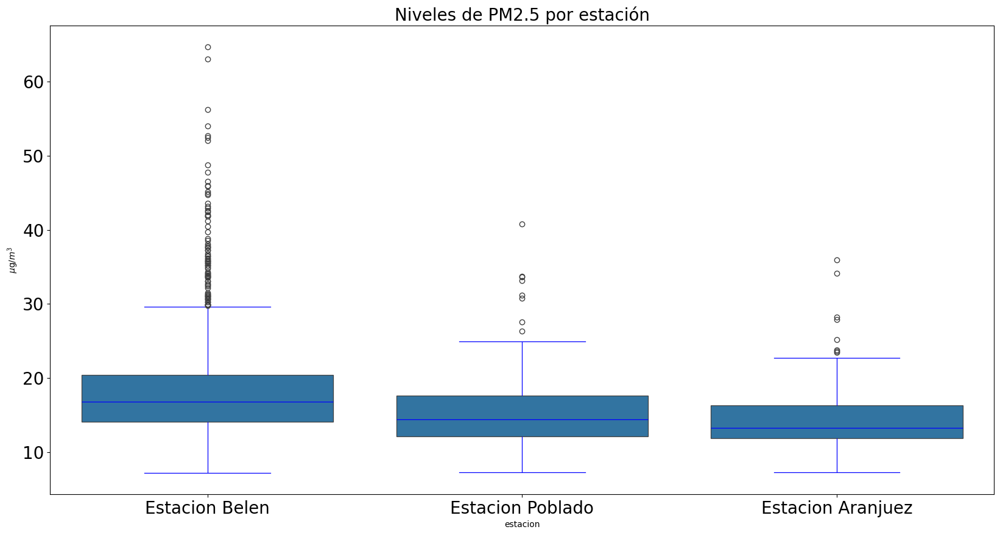

In [ ]:
# nombres de caracteristicas en minusculas calidad aire y metereológicas
calidadAire.columns = calidadAire.columns.str.lower()
meteo.columns = meteo.columns.str.lower()
# Eliminar columna p2 de dataset meteo
meteo = meteo.drop(columns=['p2'], axis=1)

# Eliminar los valores nulos en la columna pm25
calidadAire = eliminarRegistrosNulos(calidadAire,'pm25', 0)
# Pasar los valores -999.0 y -9999.0 a NaN
meteo = pasarDatosANulos(meteo,-999.0)
print(f"Cantidad de registros en mi dataframe Metereológicos con los nulos : {len(meteo)}")
meteo = meteo.dropna()
print(f"Revisión de cantidad registros con la eliminación nulos:{len(meteo)}")
# se mira los calores maximos de cada columna de los dataframes
print(f"Ver valores maximo por todas las variables de nuestro dataset :\n{calidadAire.max()}\n")
print(f"Ver valores maximo por todas las variables de nuestro dataset meteorologicos:\n{meteo.max()}\n")
print(f"Ver valores minimos por todas las variables de nuestro dataset :\n{calidadAire.min()}")
print(f"Ver valores minimos por todas las variables de nuestro dataset meteorologicos:\n{meteo.min()}\n")
calidadAireFiltrada = filtro_data(calidadAire)
meteo = calidadDatos(meteo,1)
calidadAireFiltrada = calidadDatos(calidadAireFiltrada,2)
#Sacar promedio de las variables meteorologicas 
meteoPromedio = sacarPromedio(meteo,1)
#se saca el promedio de calidad del aire
calidadAirePromedio = sacarPromedio(calidadAireFiltrada,2)
#Se usa función para definir el dia de la semana en los dos datset
calidadAirePromedio['dia_semana'] = calidadAirePromedio.apply(lambda row: definirDia(row['anio'], row['mes'], row['dia']), axis=1)
meteoPromedio['dia_semana'] = meteoPromedio.apply(lambda row: definirDia(row['anio'], row['mes'], row['dia']), axis=1)
# Aplicar la función a cada fila del DataFrame  para obtener la estación de acuerdo al código serial
calidadAirePromedio['estacion'] = calidadAirePromedio.apply(lambda row: categoriaCodigoSerial(row['codigoserial']), axis=1)
# Aplicamos la función es_festivo
calidadAirePromedio['festivo'] = calidadAirePromedio.apply(lambda row: es_festivo(row['anio'], row['mes'], row['dia']), axis=1)
# Se unieron los dos dataframes de calidad del aire y metereologicos
dataSetcalidad = unirDatos(calidadAirePromedio,meteoPromedio)
# Se define la columna de comuna
dataSetcalidad['comuna'] = dataSetcalidad.apply(lambda row: definirComunaEstacion(row['estacion']), axis=1)
#Se elimina columna codigoserial
dataSetcalidad = eliminarColumnas(dataSetcalidad, "codigoserial")
#Se guarda el dataset final de calidad del aire y metereologicos
dataSetcalidad.to_csv("data/stage/dataSetCalidadAire.csv", index=False)

# Box Plot PM2.5 agrupado por estaciones
plt.figure(figsize=(20,10) )
ax = sns.boxplot(x=dataSetcalidad['estacion'], y= dataSetcalidad['pm25'],  linewidth=0.9)
ax.set_title("Niveles de PM2.5 por estación")
plt.ylabel("$\mu$g/$m^3$")
plt.setp(ax.artists, edgecolor = 'k', facecolor='w')
plt.setp(ax.lines, color='blue')
plt.show()


Aplicacion de funciones en datos RIPS

In [ ]:
# Se hace un merge entre los datos RIPS con los datos de a que comuna pertenece la IPS de cada registro de nuestro dataset
rips2 = pd.merge(rips, comunaIPS, on='NombreIPS', how='inner')
# Eliminar columna de no interés en el estudio del dataframe.
columnasAEliminar = ['Encrypt','TipoCupsAtencion','sexo','TipoUsuario','CodigoDiagnosticoPpal',
                     'NombreDX','Nombre298','NombreEAPB','FechaSalidaUrgencias','FechaEgresoHospitalización','conteo_ips']

#Eliminar columnas de datos médicos
rips2 = eliminarColumnas(rips2,columnasAEliminar)
# Agregar columnas de fechas
rips2 = agregarColumnasFechas(rips2)
# Se aplica la función para definir el Sector de acuerdo a la comuna que pertenece la IPS
rips2['sector_ips'] = rips2.apply(lambda row: definirSectorIPS(row['comuna_ips']), axis=1)
rips2.drop('FechaConsulta',axis=1,inplace=True)
# Contamos las filas por cada combinación de 'anio', 'mes' y 'dia' y 'NombreIPS'
rips2['atenciones_por_dia'] = rips2.groupby(['NombreIPS','anio', 'mes', 'dia'])['edad'].transform('count')
#Se guarda el archivo con la limpieza pertinente de RIPS
rips2.to_csv("data/stage/dataSetRIPS.csv",index=False)

## 5) Preprocesamiento

In [ ]:
dataSetCompleto = rips2.merge(dataSetcalidad, right_on=['anio', 'mes', 'dia', 'comuna'], 
                         left_on=['anio', 'mes', 'dia', 'comuna_ips'], how='inner')

# Eliminar la columna 'comuna_ips' si ya no es necesaria
dataSetCompleto = dataSetCompleto.drop(columns=['comuna_ips'])

In [ ]:
# Agrupar por todas las columnas para identificar duplicados
grupos = dataSetCompleto.groupby(dataSetCompleto.columns.tolist()).groups

# Filtrar grupos con registros duplicados (más de un índice)
duplicados = [indices.tolist() for indices in grupos.values() if len(indices) > 1]

# Mostrar los resultados
if len(duplicados) == 0:
    print("No hay registros duplicados.")
else:
    print("Registros duplicados (índices agrupados):")
    for grupo in duplicados:
        print(f"Índices: {grupo}")

#Eliminar duplicados en el dataset completo
dataSetCompleto = dataSetCompleto.drop_duplicates()

Registros duplicados (índices agrupados):
Índices: [13243, 56793]
Índices: [24023, 28633]
Índices: [94835, 109320]
Índices: [68694, 83398, 90118]
Índices: [135150, 141426]
Índices: [8654, 102283]
Índices: [20724, 44648, 113886]
Índices: [2403, 48146]
Índices: [25485, 130434, 133402]
Índices: [65493, 71265]
Índices: [47179, 112724, 128670]
Índices: [1811, 73343, 88929]
Índices: [25634, 87310]
Índices: [12689, 34096, 64825, 92284, 100235, 111041, 111209, 131035]
Índices: [89896, 92380]
Índices: [12522, 57607, 92809, 119835, 155202]
Índices: [61934, 128622]
Índices: [3969, 69094, 117783, 126884]
Índices: [49602, 104164]
Índices: [18500, 23461]
Índices: [21920, 54506, 62750, 74646]
Índices: [97186, 144322]
Índices: [12641, 127857]
Índices: [1760, 7724, 40389, 60720, 81068, 85768, 115265, 128488, 134262]
Índices: [11420, 97817]
Índices: [48416, 122361]
Índices: [30202, 38019, 54075, 122504, 130870]
Índices: [11138, 30209, 39787, 42144, 85375, 87227, 119360, 135955]
Índices: [13418, 39128, 1

## 6) Análisis Exploratorio de Datos (EDA)

Revisar outliers con isolation forest

In [ ]:
# Variables categóricas
columnasCategoricas = dataSetCompleto.select_dtypes(include = ["object", 'category']).columns.tolist()
# Variables numéricas
columnasNumericas=dataSetCompleto.select_dtypes(include = ['float64','int32','int64']).columns.tolist()
# Seleccionar solo las columnas numéricas
cols_numericas = columnasNumericas
df_numerico = dataSetCompleto[cols_numericas]

df_numerico

# Escalar los datos para mejorar la detección
scaler = MinMaxScaler()

X_scaled = scaler.fit_transform(df_numerico)

# Aplicar Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
dataSetCompleto["outlier"] = iso_forest.fit_predict(X_scaled)  # -1 es outlier, 1 es normal
# Contar outliers detectados
num_outliers = (dataSetCompleto["outlier"] == -1).sum()
print(f"Se detectaron {num_outliers} outliers")
# Mostrar los outliers
outliers = dataSetCompleto[dataSetCompleto["outlier"] == -1]
outliers


Se detectaron 5037 outliers


,edad,NombreIPS,anio,dia,mes,sector_ips,atenciones_por_dia,pm25,calidad_pm25,dia_semana,...,calidad_temperatura,calidad_presion,calidad_precipitacion,calidad_vientos,velocidad_prom,velocidad_max,direccion_prom,direccion_max,comuna,outlier
13,1,Corporación Hospital Infantil Concejo de Medellín,2024,11,2,Nororiental,85,13.2122,1,Fin de Semana,...,1.0,1,1.0,1.0,1.900,3.5,40.0,50.0,comuna 4,-1
18,0,Corporación Hospital Infantil Concejo de Medellín,2024,31,7,Nororiental,90,14.4352,1,Inicio Semana,...,1.0,1,1.0,1.0,1.700,3.2,73.0,75.0,comuna 4,-1
21,81,Coomeva Emergencia Medica Servicio De Ambulanc...,2023,16,10,Suroriental,9,13.0318,1,Inicio Semana,...,1.0,1,1.0,1.0,0.870,1.6,56.0,63.0,comuna 14,-1
27,8,FUNDACIÓN CLÍNICA NOEL,2024,5,3,Suroriental,23,40.8211,1,Inicio Semana,...,1.0,1,1.0,1.0,1.165,2.1,46.0,52.5,comuna 14,-1
52,4,EMPRESA DE MEDICINA INTEGRAL EMI S.A.S. SERVIC...,2024,28,3,Suroriental,97,30.7728,1,Media semana,...,1.0,1,1.0,1.0,0.930,1.9,137.0,187.0,comuna 14,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155248,54,IPS SURA LOS MOLINOS MEDELLIN,2020,2,3,Suroccidental,152,33.7436,1,Inicio Semana,...,1.0,1,1.0,1.0,1.390,2.8,77.0,75.5,comuna 16,-1
155279,53,IPS SURA LOS MOLINOS MEDELLIN,2021,18,5,Suroccidental,5,15.3337,1,Inicio Semana,...,2.0,2,2.0,2.0,0.870,1.1,222.0,241.0,comuna 16,-1
155309,69,CENTRO DE SALUD ARANJUEZ,2024,19,7,Nororiental,1,12.8734,1,Media semana,...,1.0,1,1.0,1.0,1.800,3.5,44.5,56.0,comuna 4,-1
155400,26,CENTRO INTEGRAL DE SALUD ARANJUEZ,2021,8,5,Nororiental,11,9.5158,1,Fin de Semana,...,2.0,2,2.0,2.0,1.000,1.8,282.0,261.0,comuna 4,-1


C:\Users\USER\AppData\Local\Temp\ipykernel_21212\1475576559.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(
d:\programasProgramacion\anaconda\envs\monografia\Lib\site-packages\seaborn\distributions.py:2496: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


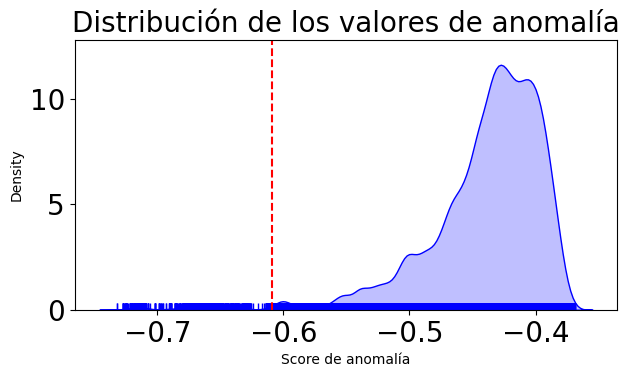

In [ ]:
score_anomalia = iso_forest.score_samples(X=X_scaled)
score_anomalia
cuantil_01 = np.quantile(score_anomalia, q=0.01)
cuantil_01

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7, 3.5))
sns.distplot(
    score_anomalia,
    hist    = False,
    rug     = True,
    color   = 'blue',
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = ax
)

ax.axvline(cuantil_01, c='red', linestyle='--', label='cuantil 0.01')
ax.set_title('Distribución de los valores de anomalía')
ax.set_xlabel('Score de anomalía');

In [ ]:
#Eliminar los outliers
dataSetCompletoSinAnomalias = dataSetCompleto[dataSetCompleto["outlier"]!= -1]
dataSetCompletoConAnomalias = dataSetCompleto[dataSetCompleto["outlier"]== -1]
len(dataSetCompletoSinAnomalias)

95699

Selección de variables

Para el estudio estas son las variables que se consideran relevantes ya que queremos pronosticar la cantidad de pacientes de acuerdo a la calidad del aire y sobre los sectores o comunas que se encuentras las IPS 

In [ ]:
# Se seleccionan las columnas relevantes para el estudio
datosEstudio = dataSetCompletoSinAnomalias[['edad', 'anio', 'dia', 'mes', 'sector_ips','NombreIPS','estacion',
       'atenciones_por_dia', 'pm25', 'dia_semana',
       'festivo', 'temperatura', 'humedad', 'presion', 'p1',
        'velocidad_prom', 'velocidad_max', 'direccion_prom',
       'direccion_max', 'comuna']].copy()



División de columnas categoricas discretas de las numéricas continuas

In [ ]:
# Se seleccionan las columnas relevantes para la correlación
columnasCorrelacion = datosEstudio[['edad', 'atenciones_por_dia', 'pm25',
        'temperatura', 'humedad', 'presion', 'p1',
        'velocidad_prom', 'velocidad_max', 'direccion_prom',
       'direccion_max']].columns

columnasDiscretas = datosEstudio[['anio', 'dia', 'mes','festivo']].columns


Revisar Correlación de los datos

<Axes: >

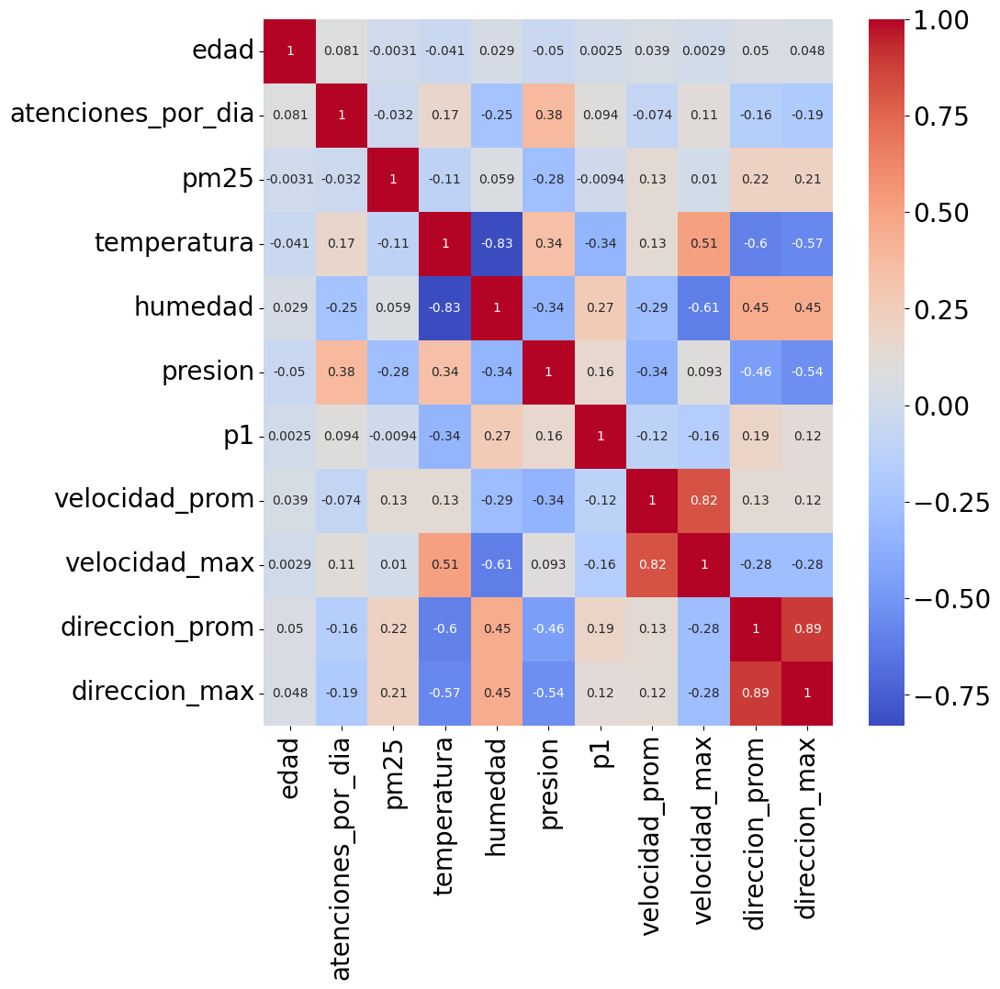

In [ ]:
#Se mira la correlación de los datos
datosEstudioCorrelacion = datosEstudio[columnasCorrelacion]
corr_matrix = datosEstudioCorrelacion.corr()
corr_matrix

# Visualizar la matriz de correlación
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

Se gráfican las variables continuas

C:\Users\USER\AppData\Local\Temp\ipykernel_21212\3417629502.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datosEstudioCorrelacion['estacion'] = datosEstudio['estacion']


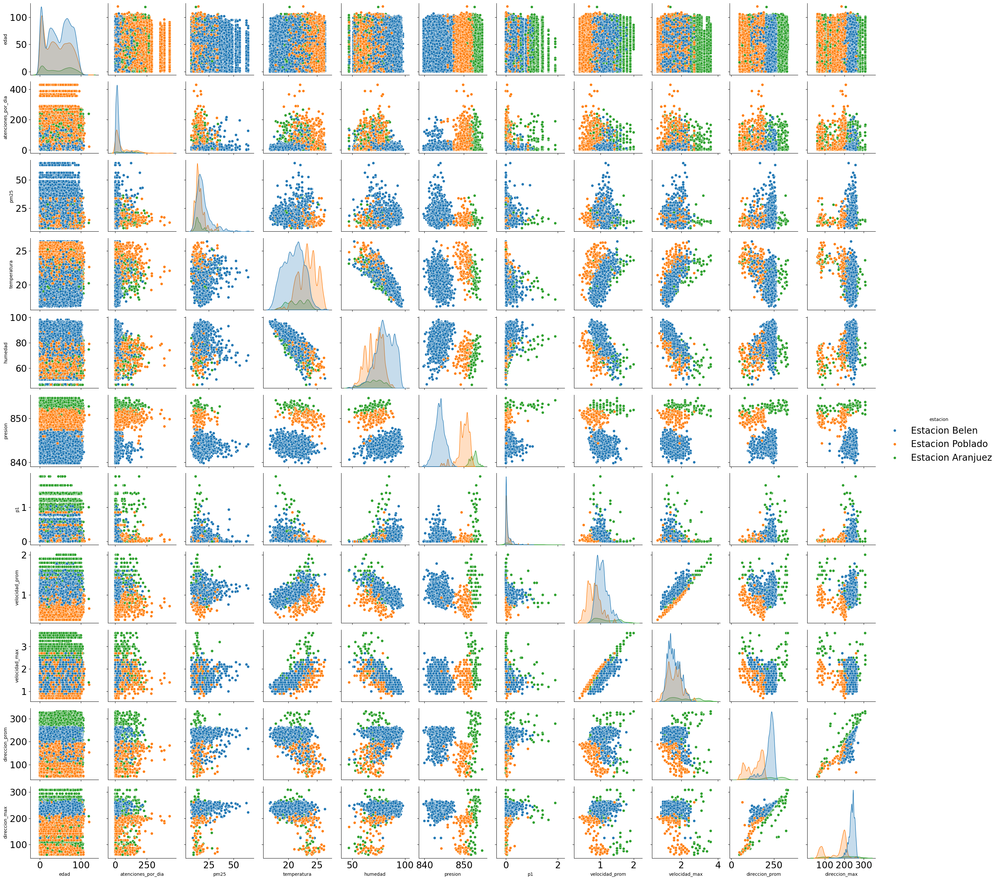

In [ ]:
datosEstudioCorrelacion['estacion'] = datosEstudio['estacion']
sns.pairplot(datosEstudioCorrelacion, hue= 'estacion')

Selección variables de acuerdo a los resultados de correlación

In [ ]:
#Se eliminan columnas con correlacion superior a 0.8 en el caso de direccion_max 
datosEstudio.drop(columns=['direccion_max','velocidad_max'], axis= 1, inplace=True)
datosEstudio.columns

Index(['edad', 'anio', 'dia', 'mes', 'sector_ips', 'NombreIPS', 'estacion',
       'atenciones_por_dia', 'pm25', 'dia_semana', 'festivo', 'temperatura',
       'humedad', 'presion', 'p1', 'velocidad_prom', 'direccion_prom',
       'comuna'],
      dtype='object')

Graficación de las variables categoricas

In [ ]:
columnasCategoricas = datosEstudio.select_dtypes(include=['object', 'category']).columns

columnasCategoricas

Index(['sector_ips', 'estacion', 'dia_semana', 'comuna'], dtype='object')

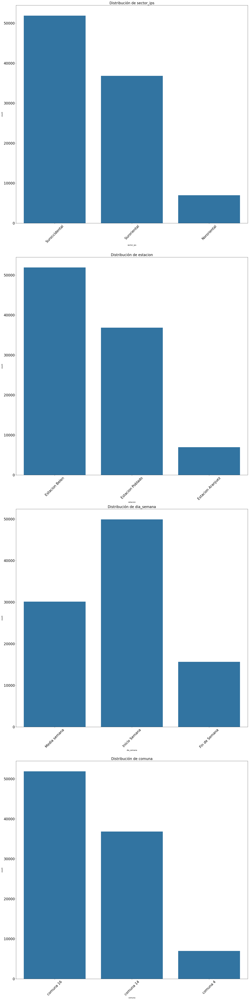

In [ ]:
columnasCategoricas = datosEstudio.select_dtypes(include=['object', 'category']).columns
#No tenemos en cuenta la columna NombreIPS ya que esta son muchas y la gráfica se ve fea
columnasCategoricas= columnasCategoricas.drop('NombreIPS')
datosEstudioCategoricas = datosEstudio[columnasCategoricas]
n_cols = 1
n_rows = (len(columnasCategoricas) + n_cols - 1) // n_cols  # Para asegurarnos de cubrir todas

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20 * n_rows))
axes = axes.flatten()  # Para poder iterar fácilmente

for i, col in enumerate(columnasCategoricas):
    sns.countplot(data=datosEstudioCategoricas, x=col, ax=axes[i])
    axes[i].set_title(f'Distribución de {col}')
    axes[i].tick_params(axis='x', rotation=45)

# Si sobran ejes (por ejemplo hay 3 columnas pero 4 subplots), los escondemos
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Se gráfican las variables Discretas

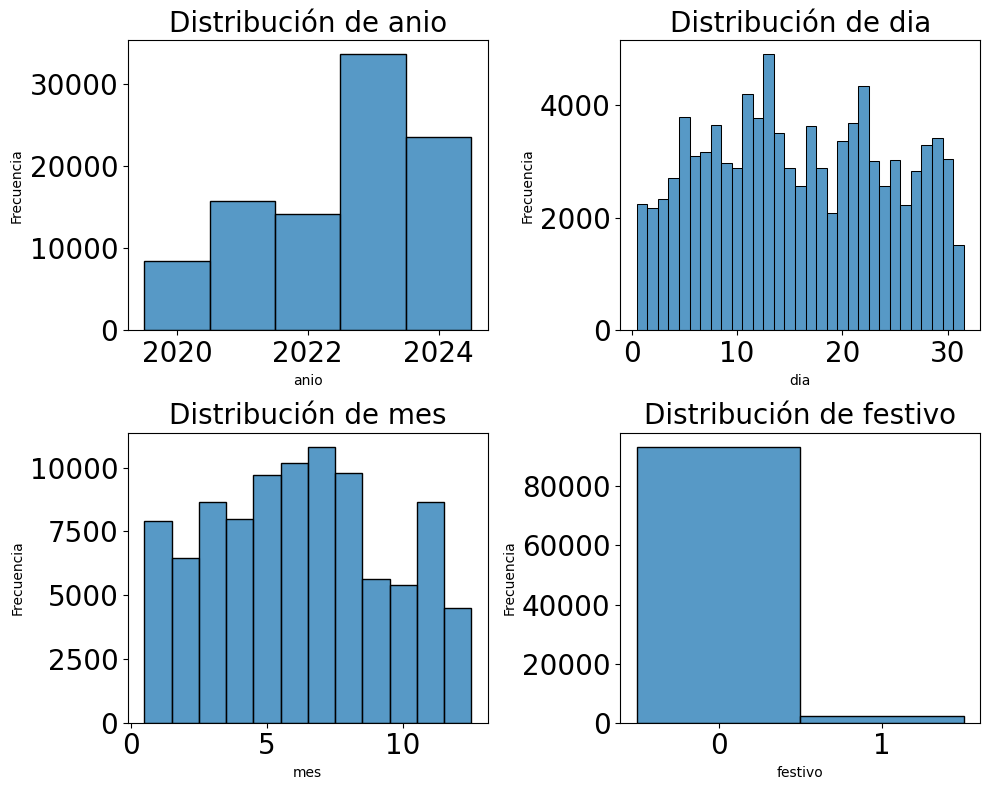

In [ ]:
datosEstudioDiscretas = datosEstudio[columnasDiscretas]
# Tamaño del gráfico
n_cols = 2
n_rows = (len(columnasDiscretas) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 4 * n_rows))
axes = axes.flatten()

# Graficamos con histplot (discrete=True)
for i, col in enumerate(columnasDiscretas):
    sns.histplot(data=datosEstudioDiscretas, x=col, discrete=True, ax=axes[i])
    axes[i].set_title(f'Distribución de {col}')
    axes[i].set_ylabel('Frecuencia')

# Ocultar subplots vacíos si hay
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
# Seleccionar las columnas categóricas automáticamente
cols_categoricas = datosEstudio.select_dtypes(include=['object', 'category']).columns
# Crear instancia de OrdinalEncoder sin definir orden (usa orden alfabético)
encoder = OrdinalEncoder()
# Aplicar la transformación directamente a las columnas categóricas
datosEstudio[cols_categoricas] = encoder.fit_transform(datosEstudio[cols_categoricas])
#Se guarda el dataset completo sin escalar los datos y dejando las columnas categoricas como ordinales
datosEstudio.to_csv("data/analytics/datasetEstudio-2020-2024.csv", index=False)

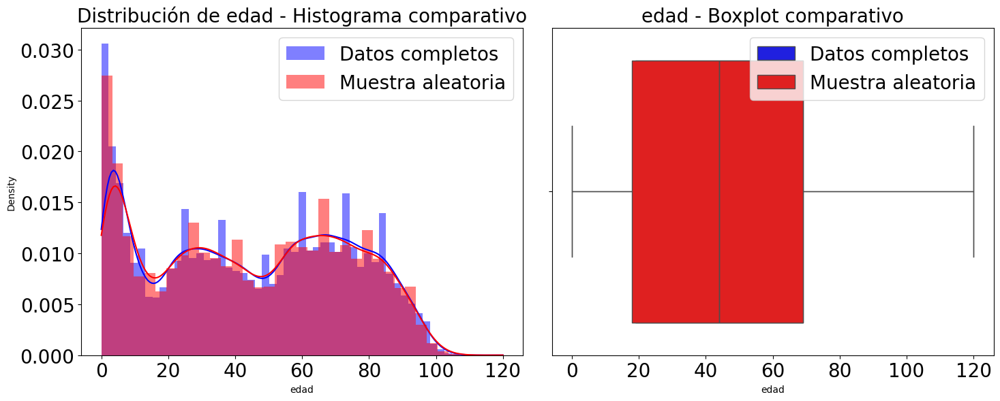

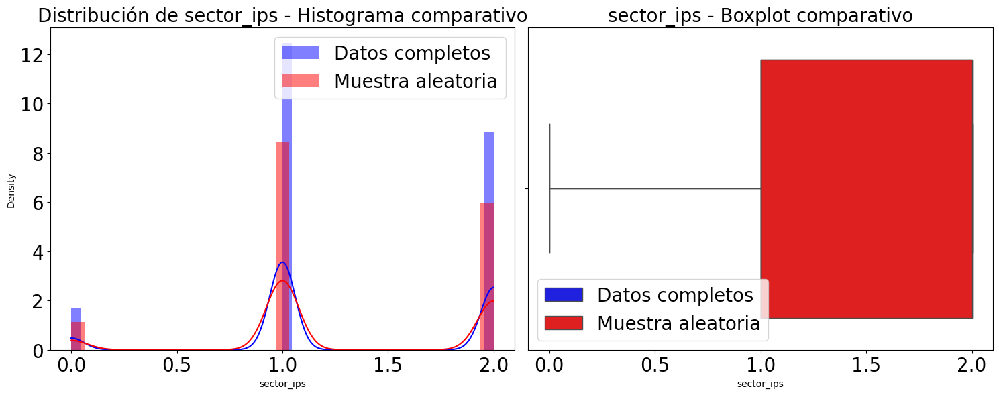

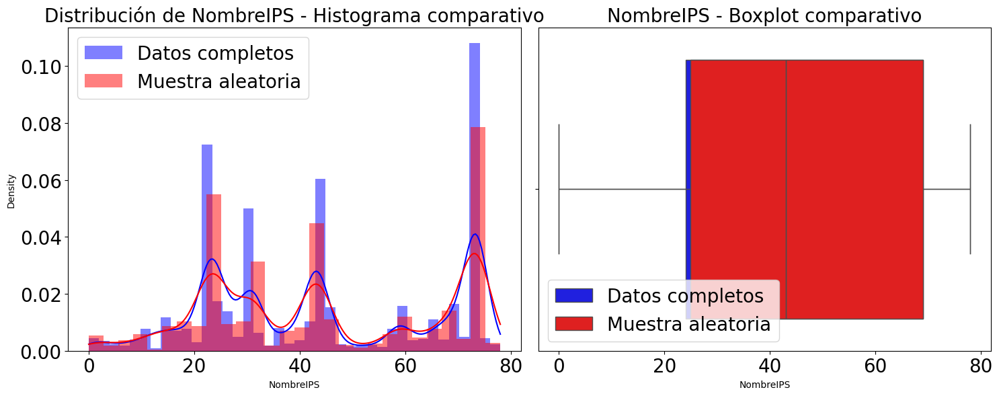

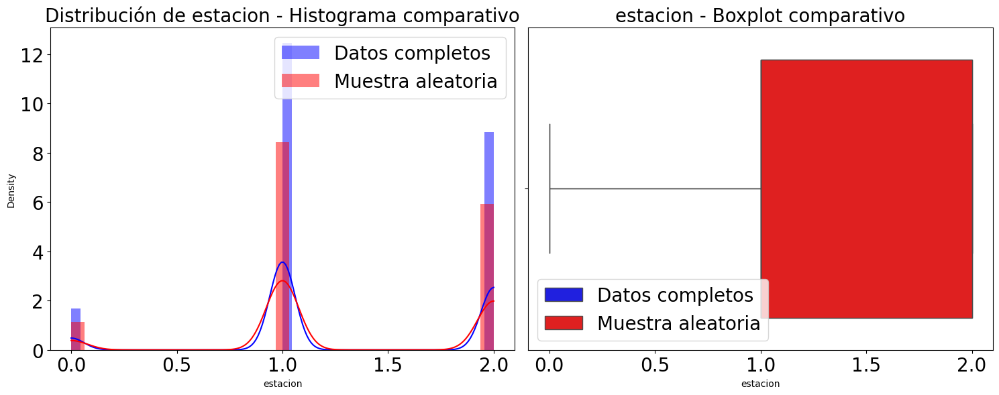

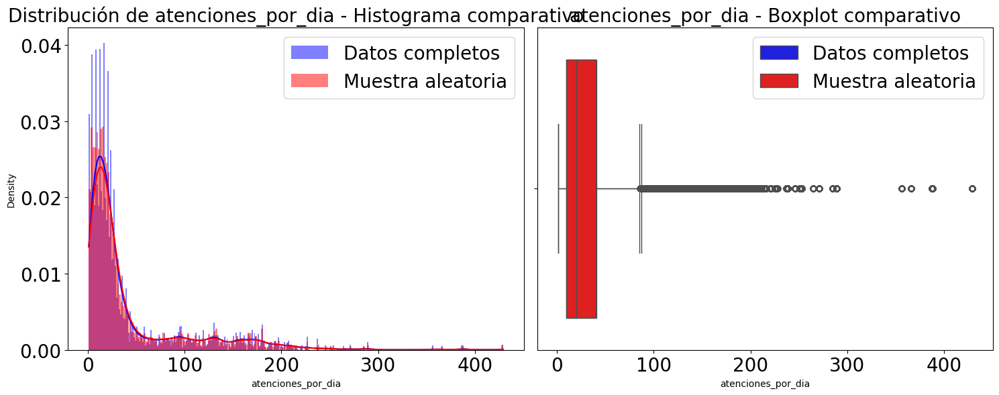

...

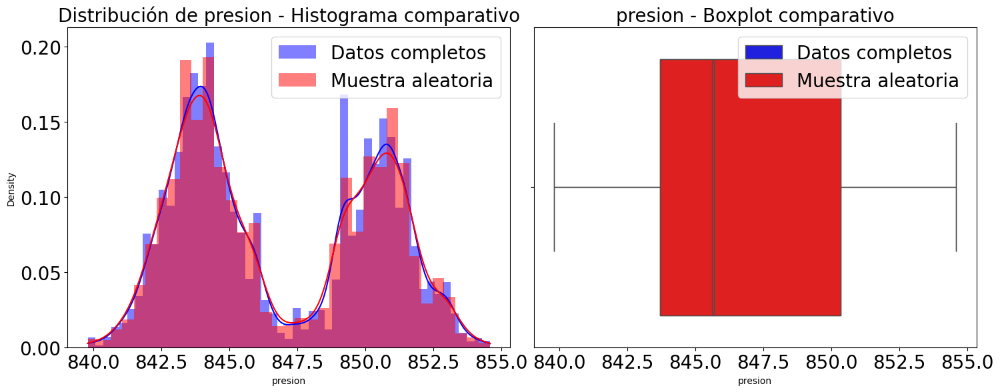

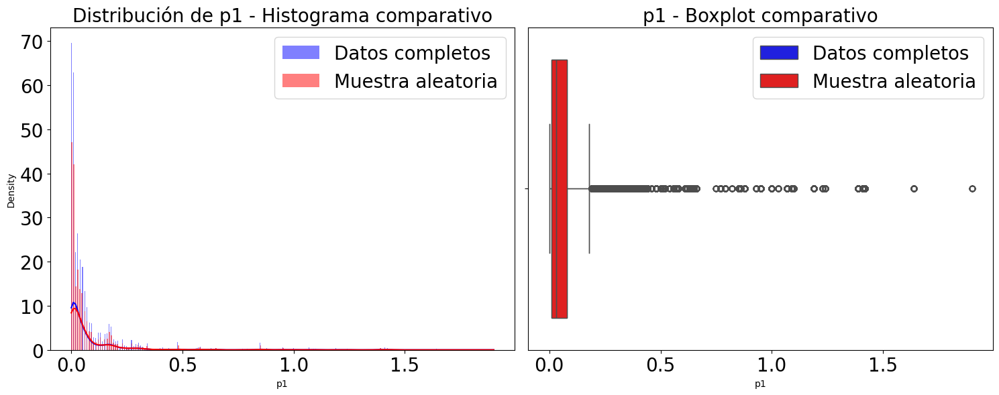

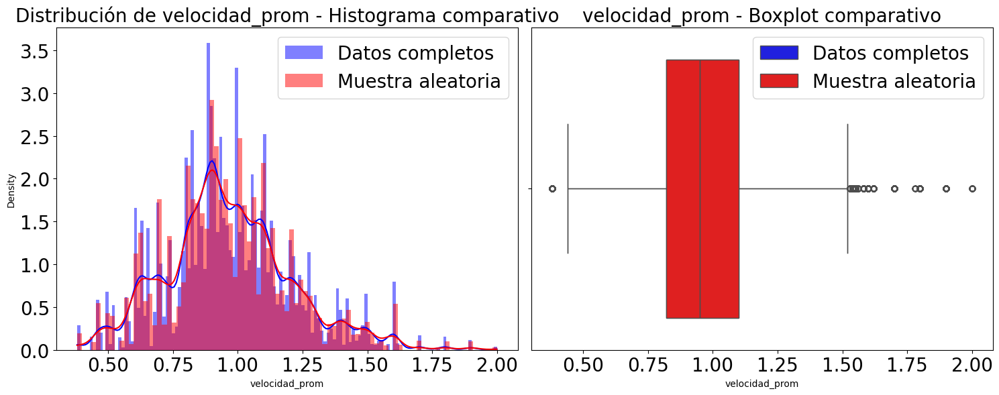

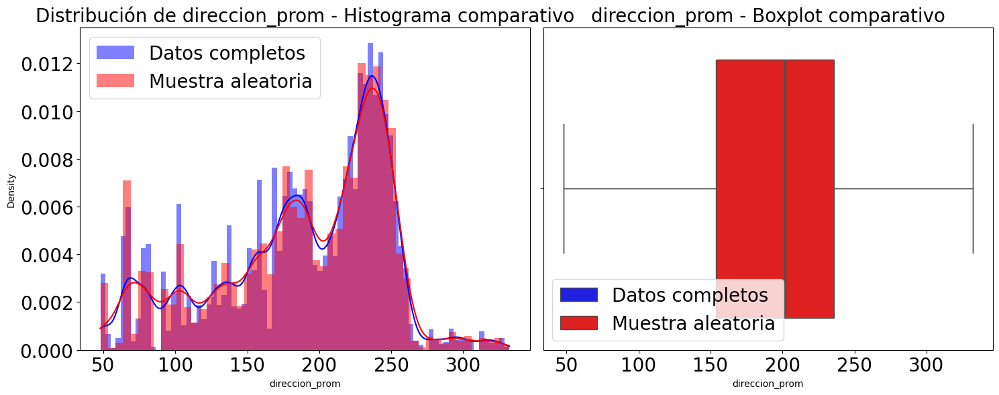

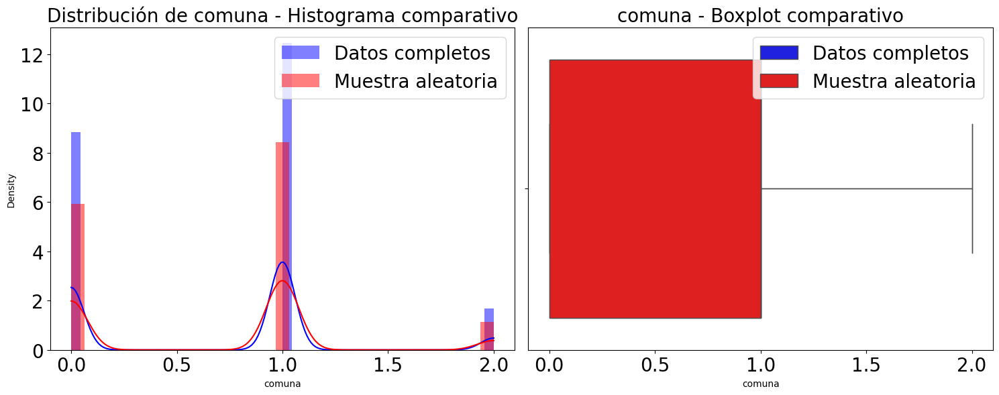

In [ ]:
dataset = datosEstudio.copy()
datasetMuestra = dataset.sample(frac=0.3, random_state=42)  # Tomemos una fracción de los datos
datasetMuestra.head()
# Por cada columna en el dataset
for col in dataset.columns:
    # Comprobamos si la columna es numérica (int o float)
    if dataset[col].dtype == 'float64' or dataset[col].dtype == 'int64':
        # Crear una figura con 2 subplots (1 fila, 2 columnas)
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))

        # Histograma en el primer subplot (izquierda)
        sns.histplot(dataset[col], kde=True, color='blue', label='Datos completos', stat='density', linewidth=0, ax=axes[0])
        sns.histplot(datasetMuestra[col], kde=True, color='red', label='Muestra aleatoria', stat='density', linewidth=0, ax=axes[0])
        axes[0].set_title(f'Distribución de {col} - Histograma comparativo')
        axes[0].legend()

        # Boxplot en el segundo subplot (derecha)
        sns.boxplot(x=dataset[col], color='blue', label='Datos completos', ax=axes[1])
        sns.boxplot(x=datasetMuestra[col], color='red', label='Muestra aleatoria', ax=axes[1])
        axes[1].set_title(f'{col} - Boxplot comparativo')
        axes[1].legend()

        # Ajustar el espacio entre los subplots
        plt.tight_layout()
        plt.show()


## 7) Escalamiento de los datos

In [ ]:
#Escalar los datos
scaler = MinMaxScaler()
datosEstudio[datosEstudio.columns] = scaler.fit_transform(datosEstudio[datosEstudio.columns])
# Guardar el escalador en un archivo
joblib.dump(scaler, 'data/analytics/scaler.pkl')
#Guardar los datosEscalados
datosEstudio.to_csv('data/analytics/datasetEstudio-2020-2024Escalados.csv', index=False, sep = ',')

## 8) Evaluación modelos Primera iteración

Modelo XGBoosting

In [ ]:
dataset = datosEstudio.copy()
dataset.head(2)

,edad,anio,dia,mes,sector_ips,NombreIPS,estacion,atenciones_por_dia,pm25,dia_semana,festivo,temperatura,humedad,presion,p1,velocidad_prom,direccion_prom,comuna
0,0.6583,0.00,0.6667,0.0909,0.5,0.5513,0.5,0.2243,0.4703,1.0,0.0,0.189,0.8248,0.2250,0.2316,0.4568,0.7359,0.5
1,0.7333,0.75,0.1667,0.7273,1.0,0.3974,1.0,0.2991,0.1339,0.5,0.0,0.918,0.1061,0.7027,0.0000,0.2593,0.3415,0.0


División de datos y uso del modelo

Mean Squared Error (MSE): 0.00019507479278236064
Root Mean Squared Error (RMSE): 0.013966917798224511
R-squared (R2): 0.9890298223462479


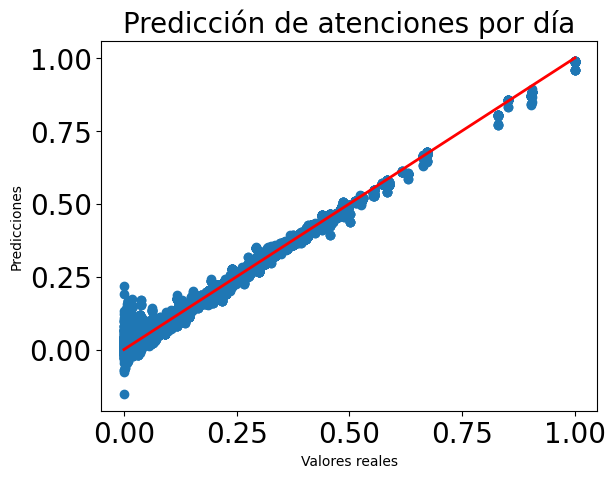

In [ ]:
X = dataset.drop('atenciones_por_dia', axis=1)
y = dataset['atenciones_por_dia']
# Separar datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Definir el modelo
modelXGB = XGBRegressor()
# Entrenar el modelo
modelXGB.fit(X_train, y_train)
# Predecir valores
y_pred = modelXGB.predict(X_test)
# Calcular el error cuadr�tico medio

#Metricas del modelo SVM
from sklearn.metrics import mean_absolute_error


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
#Metricas mae
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')
# Graficar la predicción vs el valor real
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='L�nea de referencia')  # L�nea de referencia
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title('Predicción de atenciones por día')
plt.show()



Rectificar si existe sobreajuste en el modelo XGBossting

In [ ]:

# Predicciones en el conjunto de entrenamiento
y_train_pred = modelXGB.predict(X_train)

# Calcular el error cuadr�tico medio en entrenamiento
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

# Imprimir las m�tricas para el conjunto de entrenamiento
print(f'Mean Squared Error (MSE) en entrenamiento: {mse_train}')
print(f'Root Mean Squared Error (RMSE) en entrenamiento: {rmse_train}')
print(f'R-squared (R2) en entrenamiento: {r2_train}')

Mean Squared Error (MSE) en entrenamiento: 0.00016320963358028415
Root Mean Squared Error (RMSE) en entrenamiento: 0.012775352581446985
R-squared (R2) en entrenamiento: 0.9910194093737043


Modelo Light Gradient Boosting

In [ ]:
dataset = datosEstudio.copy()
dataset.head(2)

,edad,anio,dia,mes,sector_ips,NombreIPS,estacion,atenciones_por_dia,pm25,dia_semana,festivo,temperatura,humedad,presion,p1,velocidad_prom,direccion_prom,comuna
0,0.6583,0.00,0.6667,0.0909,0.5,0.5513,0.5,0.2243,0.4703,1.0,0.0,0.189,0.8248,0.2250,0.2316,0.4568,0.7359,0.5
1,0.7333,0.75,0.1667,0.7273,1.0,0.3974,1.0,0.2991,0.1339,0.5,0.0,0.918,0.1061,0.7027,0.0000,0.2593,0.3415,0.0


División de los datos y uso del modelo

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1712
[LightGBM] [Info] Number of data points in the train set: 66989, number of used features: 17
[LightGBM] [Info] Start training from score 0.098336
Mean Squared Error (MSE): 0.00010102553188571023
Root Mean Squared Error (RMSE): 0.010051145799644447
R-squared (R2): 0.9943187532507725


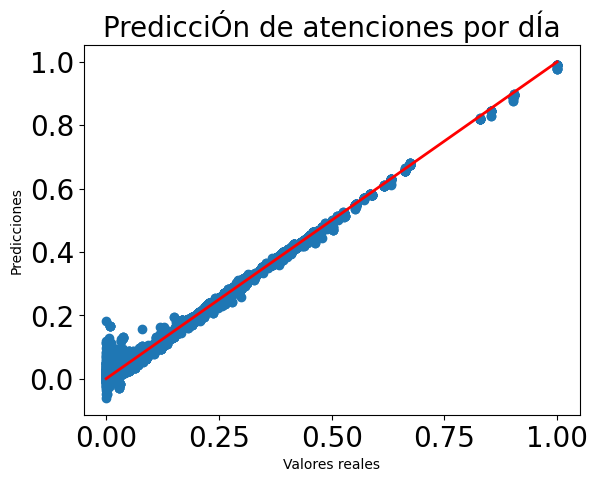

In [ ]:
X = dataset.drop('atenciones_por_dia', axis=1)
y = dataset['atenciones_por_dia']
# Separar datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#Usar modelo LGBM
lgbm = LGBMRegressor(n_estimators=1000, learning_rate=0.05, num_leaves=32, random_state=42)

lgbm.fit(X_train, y_train)

# Predecir sobre datos de prueba

y_pred = lgbm.predict(X_test)
# Evaluar el modelo
#Metricas del modelo SVM
from sklearn.metrics import mean_absolute_error


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
#Metricas mae
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')
# Graficar la predicci�n vs el valor real
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='L�nea de referencia')  # L�nea de referencia
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title('PredicciÓn de atenciones por dÍa')
plt.show()

Verificación que no exista sobreajuste

In [ ]:
# Predicciones en el conjunto de entrenamiento
y_train_pred = lgbm.predict(X_train)

# Calcular el error cuadr�tico medio en entrenamiento
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

# Imprimir las m�tricas para el conjunto de entrenamiento
print(f'Mean Squared Error (MSE) en entrenamiento: {mse_train}')
print(f'Root Mean Squared Error (RMSE) en entrenamiento: {rmse_train}')
print(f'R-squared (R2) en entrenamiento: {r2_train}')


Mean Squared Error (MSE) en entrenamiento: 8.69591337245559e-05
Root Mean Squared Error (RMSE) en entrenamiento: 0.009325188133467116
R-squared (R2) en entrenamiento: 0.995215084035996


Random Forest Modelo

In [ ]:
dataset = datosEstudio.copy()
dataset.head(2)

,edad,anio,dia,mes,sector_ips,NombreIPS,estacion,atenciones_por_dia,pm25,dia_semana,festivo,temperatura,humedad,presion,p1,velocidad_prom,direccion_prom,comuna
0,0.6583,0.00,0.6667,0.0909,0.5,0.5513,0.5,0.2243,0.4703,1.0,0.0,0.189,0.8248,0.2250,0.2316,0.4568,0.7359,0.5
1,0.7333,0.75,0.1667,0.7273,1.0,0.3974,1.0,0.2991,0.1339,0.5,0.0,0.918,0.1061,0.7027,0.0000,0.2593,0.3415,0.0


division de los datos y uso del modelo

Mean Squared Error (MSE): 2.1414475950909678e-05
Root Mean Squared Error (RMSE): 0.0046275777628160585
R-squared (R2): 0.9987957408428183


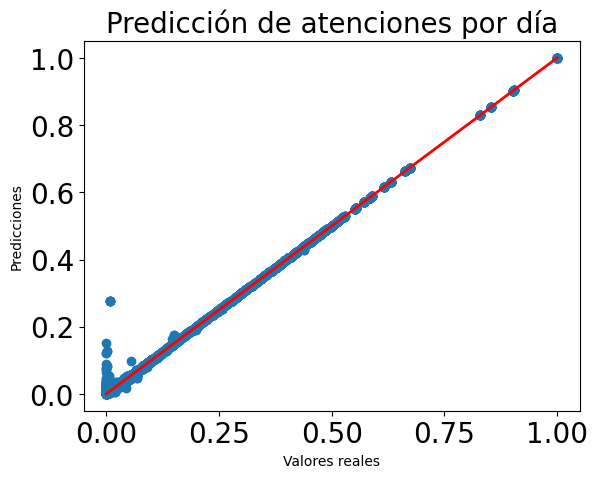

In [ ]:
X = dataset.drop('atenciones_por_dia', axis=1)
y = dataset['atenciones_por_dia']
# Separar datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#Uso del modelo de random forest regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predecir con los datos de prueba

y_pred = rf_model.predict(X_test)

# Evaluar el modelo
#Metricas del modelo SVM
from sklearn.metrics import mean_absolute_error


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
#Metricas mae
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')
# Graficar la predicci�n vs el valor real
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='L�nea de referencia')  # L�nea de referencia
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title('Predicción de atenciones por día')
plt.show()


Validación que no exista Sobre Ajuste en el modelo

In [ ]:
# Predicciones en el conjunto de entrenamiento
y_train_pred = rf_model.predict(X_train)

# Calcular el error cuadr�tico medio en entrenamiento
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

# Imprimir las m�tricas para el conjunto de entrenamiento
print(f'Mean Squared Error (MSE) en entrenamiento: {mse_train}')
print(f'Root Mean Squared Error (RMSE) en entrenamiento: {rmse_train}')
print(f'R-squared (R2) en entrenamiento: {r2_train}')

Mean Squared Error (MSE) en entrenamiento: 2.265869157960592e-06
Root Mean Squared Error (RMSE) en entrenamiento: 0.0015052804250240525
R-squared (R2) en entrenamiento: 0.9998753208197703


Tabla con los resulatdos de los modelos

In [ ]:
#Se crea un dataframe y se define las columnas
metrics_df = pd.DataFrame(columns=['Modelo', 'R²', 'MSE', 'RMSE', 'MAE'])
# Diccionario para almacenar las predicciones por modelo
pred_dict = {}
# Lista de modelos entrenados
models = {
    'Modelo Xgboost': modelXGB,
    'Modelo Light Gradient': lgbm,
    'Modelo Random Forest': rf_model
}

# Evaluar cada modelo
for model_name, model in models.items():
    # Hacer predicciones
    y_pred = model.predict(X_test)

    
    # Calcular las métricas
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Crear un DataFrame para las métricas del modelo actual
    model_metrics = pd.DataFrame([{
        'Modelo': model_name,
        'R²': r2,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae
    }])
    
    # Concatenar el DataFrame actual con el DataFrame de métricas
    metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)
    # Almacenar las predicciones en el diccionario con una clave que seria el nombre del modelo
    pred_dict[f'y_pred_{model_name}'] = y_pred

# Mostrar la tabla de métricas
print(metrics_df)



C:\Users\USER\AppData\Local\Temp\ipykernel_21212\597904037.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)


                  Modelo      R²         MSE    RMSE     MAE
0         Modelo Xgboost  0.9890  1.9507e-04  0.0140  0.0096
1  Modelo Light Gradient  0.9943  1.0103e-04  0.0101  0.0069
2   Modelo Random Forest  0.9988  2.1414e-05  0.0046  0.0006


## 9) PCA

In [ ]:
dataSetCompletoSinEscalar = pd.read_csv("data/analytics/datasetEstudio-2020-2024.csv")
dataSetCompletoSinEscalar.head()

,edad,anio,dia,mes,sector_ips,NombreIPS,estacion,atenciones_por_dia,pm25,dia_semana,festivo,temperatura,humedad,presion,p1,velocidad_prom,direccion_prom,comuna
0,79,2020,21,2,1.0,43.0,1.0,97,34.2562,2.0,0,18.58,89.030,843.13,0.44,1.12,257.0,1.0
1,88,2023,6,9,2.0,31.0,2.0,129,14.9075,1.0,0,25.60,52.230,850.20,0.00,0.80,145.0,0.0
2,89,2024,5,7,2.0,31.0,2.0,142,15.2972,2.0,0,21.40,77.175,851.78,0.03,0.38,187.0,0.0
3,64,2021,11,5,2.0,59.0,2.0,46,9.7798,1.0,0,23.30,67.000,849.20,0.00,0.88,96.5,0.0
4,87,2023,22,4,2.0,31.0,2.0,144,12.2535,0.0,0,21.20,79.260,849.70,0.02,0.70,176.0,0.0


Uso de PCA para reducción de dimensionalidad de los datos

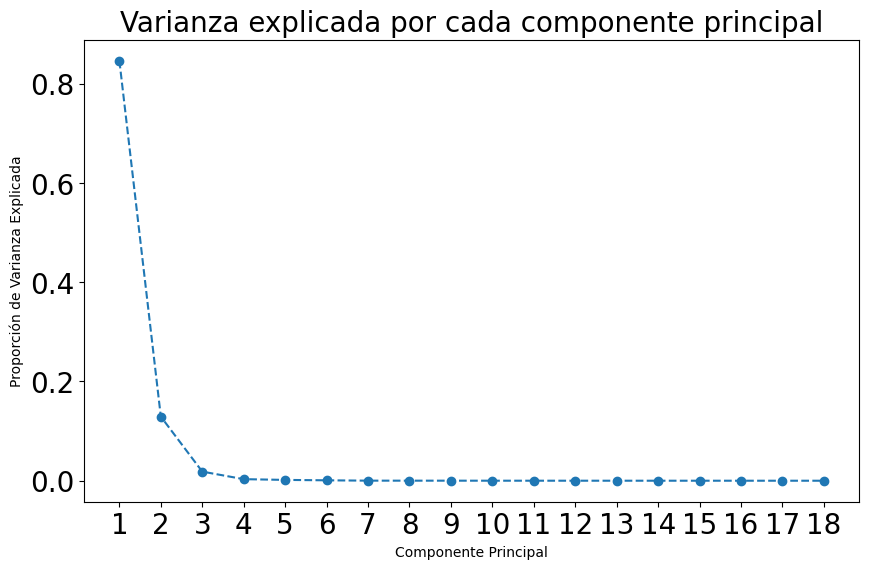

In [ ]:
# Separar las columnas numéricas continuas y categóricas-discretas
columnas_numericas_continuas = ['edad', 'atenciones_por_dia', 'pm25', 'temperatura', 'humedad', 
                                'presion', 'p1', 'velocidad_prom', 
                                'direccion_prom']

columnas_numericas_categoricas = ['anio', 'dia', 'mes', 'sector_ips', 'NombreIPS', 
                                  'estacion', 'dia_semana', 'festivo', 'comuna']

# Escalar las columnas numéricas continuas
scaler = MinMaxScaler()
data_continuas_escaladas = scaler.fit_transform(dataSetCompletoSinEscalar[columnas_numericas_continuas])

# Concatenar las columnas categóricas (ya codificadas) con las continuas escaladas
data_categoricas = dataSetCompletoSinEscalar[columnas_numericas_categoricas].values
data_final = pd.DataFrame(data_categoricas, columns=columnas_numericas_categoricas)
data_final[columnas_numericas_continuas] = data_continuas_escaladas

pca = PCA()
pca_result = pca.fit_transform(data_final)

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--')
plt.title('Varianza explicada por cada componente principal')
plt.xlabel('Componente Principal')
plt.ylabel('Proporción de Varianza Explicada')
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.show()

Rectificar la importancia de las variables de los diferentes componentes principales

In [ ]:
# Mostrar la importancia de las variables en los componentes principales
importancia_variables = pd.DataFrame(pca.components_, columns=data_final.columns, index=[f'PC{i+1}' for i in range(len(pca.components_))])
print("Importancia de las variables en los componentes principales:")
importancia_variables

# Filtrar solo los primeros 5 componentes principales
importancia_top5 = importancia_variables.iloc[:5]

# Mostrar la importancia (valores absolutos ordenados) por componente
for i in range(5):
    print(f"\nImportancia de variables en PC{i+1} (ordenadas):")
    print(importancia_top5.iloc[i].abs().sort_values(ascending=False))

Importancia de las variables en los componentes principales:

Importancia de variables en PC1 (ordenadas):
NombreIPS             9.9993e-01
estacion              6.1484e-03
comuna                6.1484e-03
sector_ips            6.1484e-03
presion               2.5179e-03
mes                   2.0680e-03
direccion_prom        1.9062e-03
temperatura           1.3917e-03
humedad               1.2482e-03
velocidad_prom        1.0004e-03
dia_semana            7.4653e-04
pm25                  4.3990e-04
dia                   2.3779e-04
anio                  2.0199e-04
atenciones_por_dia    1.8880e-04
festivo               1.1489e-04
edad                  1.3058e-05
p1                    1.1955e-05
Name: PC1, dtype: float64

Importancia de variables en PC2 (ordenadas):
dia                   9.9997e-01
anio                  5.9012e-03
mes                   2.0805e-03
temperatura           1.3868e-03
dia_semana            1.2508e-03
humedad               1.2269e-03
estacion              1.2090e

Gráficamos la importancia de las variables de los 5 componentes principales para poder determinar y seleccionar variables

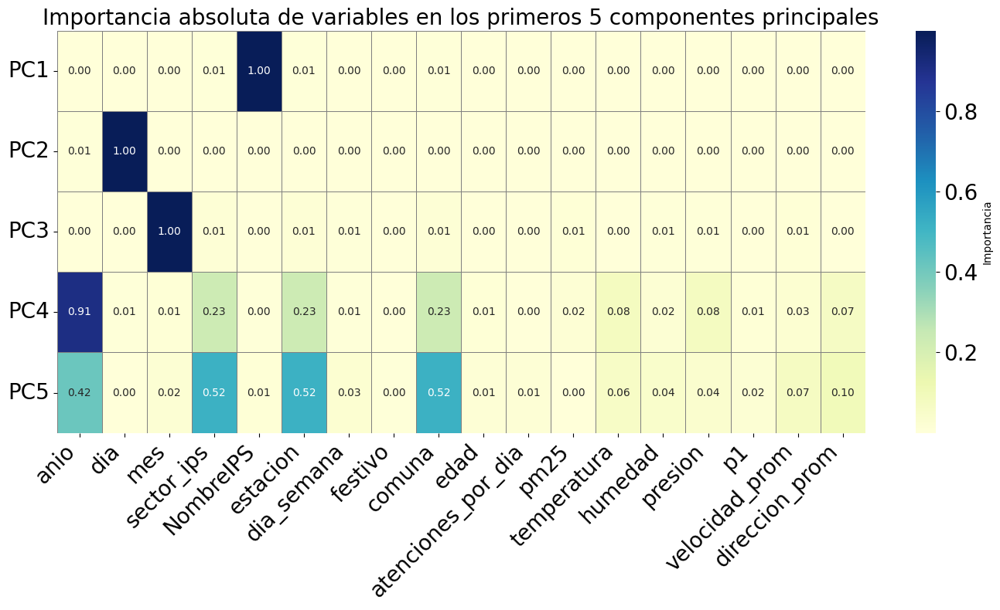

In [ ]:
plt.figure(figsize=(14, 8))
sns.heatmap(importancia_top5.abs(), annot=True, fmt=".2f", cmap="YlGnBu", linewidths=0.5, linecolor='gray', cbar_kws={'label': 'Importancia'})
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title("Importancia absoluta de variables en los primeros 5 componentes principales")
plt.tight_layout()
plt.show()

Determinación de las variables con Random Forest Regressor

Importancia de las variables según Random Forest:
NombreIPS         0.5411
presion           0.1584
anio              0.1077
mes               0.0626
comuna            0.0204
dia_semana        0.0151
estacion          0.0127
sector_ips        0.0122
p1                0.0121
dia               0.0119
pm25              0.0118
humedad           0.0097
direccion_prom    0.0092
velocidad_prom    0.0071
temperatura       0.0061
festivo           0.0019
edad              0.0001
dtype: float64


C:\Users\USER\AppData\Local\Temp\ipykernel_21212\3755896881.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importancia_rf.values, y=importancia_rf.index, palette="viridis")


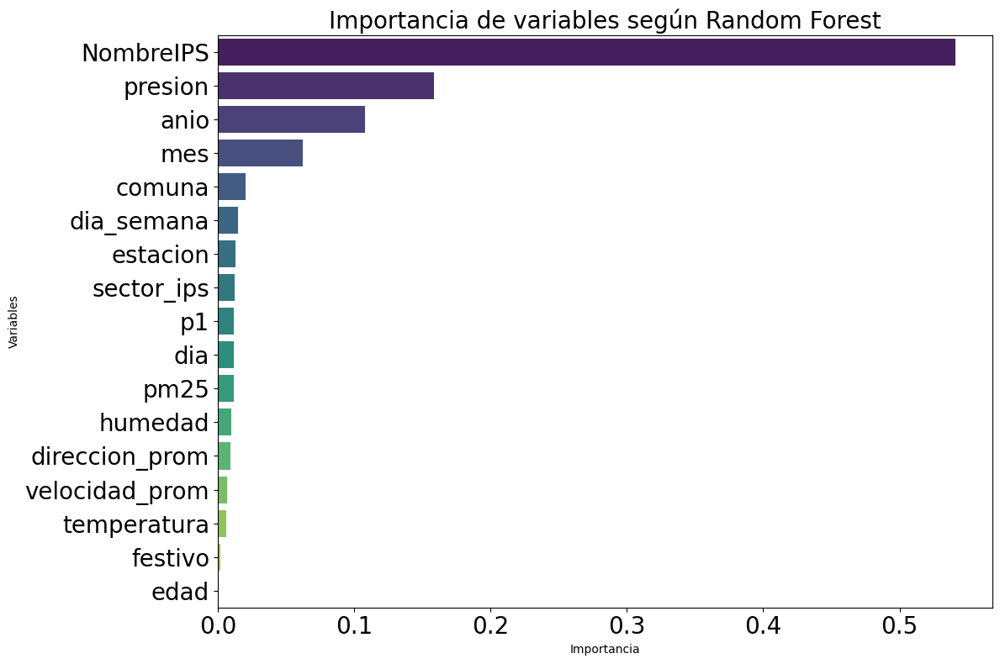

In [ ]:
# Definir X y y
X = data_final.drop(columns=['atenciones_por_dia'])
y = data_final['atenciones_por_dia'].astype(float)

#Entrenar Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

# Obtener la importancia de las variables
importancia_rf = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("Importancia de las variables según Random Forest:")
print(importancia_rf)
#Se hace gráfica de barras para encontrar esas variables relevantes
plt.figure(figsize=(12, 8))
sns.barplot(x=importancia_rf.values, y=importancia_rf.index, palette="viridis")
plt.title("Importancia de variables según Random Forest")
plt.xlabel("Importancia")
plt.ylabel("Variables")
plt.tight_layout()
plt.show()

Guardar PCA y su scaler

In [ ]:
#joblib.dump(xgb_model, "data/analytics/xgb_modelPCA.pkl")
joblib.dump(scaler, "data/analytics/scalerPCA.pkl")
joblib.dump(pca, "data/analytics/pca.pkl")

['data/analytics/pca.pkl']

Cargamos los anteriormente guardado

In [ ]:
#xgb_model = joblib.load("data/analytics/xgb_modelPCA.pkl")
scaler = joblib.load("data/analytics/scalerPCA.pkl")
pca = joblib.load("data/analytics/pca.pkl")

Revisemos la variable NombreIPS

In [ ]:
# Revisemos NombreIPS
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA()
pca_components = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(pca_components, columns=[f"PC{i+1}" for i in range(pca_components.shape[1])])

importancia_variables = pd.DataFrame(pca.components_, columns=X.columns, index=[f"PC{i+1}" for i in range(pca.components_.shape[0])])

print("Importancia de la variable 'NombreIPS' en los componentes principales:")
print(importancia_variables["NombreIPS"])


Importancia de la variable 'NombreIPS' en los componentes principales:
PC1    -1.4178e-01
PC2     3.6704e-02
PC3     1.4932e-01
PC4     1.8745e-01
PC5     8.8242e-02
PC6     8.5339e-01
PC7    -3.2257e-01
PC8     4.2815e-02
PC9     2.8125e-01
PC10    3.1946e-03
PC11    2.1549e-03
PC12   -5.1342e-03
PC13   -5.5775e-03
PC14    1.2013e-03
PC15   -1.2026e-03
PC16   -3.1150e-15
PC17   -1.7130e-15
Name: NombreIPS, dtype: float64


Se hace una prueba llamada ANOVA

In [ ]:
data = pd.read_csv("data/analytics/datasetEstudio-2020-2024.csv")
grupos = data.groupby("NombreIPS")["atenciones_por_dia"].apply(list)

# Realizar la prueba ANOVA
f_stat, p_val = f_oneway(*grupos)

print("\nResultados de la prueba ANOVA:")
print(f"F-statistic: {f_stat}")
print(f"p-value: {p_val}")

if p_val < 0.05:
    print("Conclusión: Existen diferencias significativas entre los grupos.")
else:
    print("Conclusión: No se encuentran diferencias significativas entre los grupos.")


Resultados de la prueba ANOVA:
F-statistic: 2475.3396709669487
p-value: 0.0
Conclusión: Existen diferencias significativas entre los grupos.


Conclusión Explicada :
F-statistic: 2475.34

Un valor F tan alto indica una diferencia muy significativa entre los grupos definidos por "NombreIPS".


p-value: 0.0\
Un p-value de 0.0 significa que la probabilidad de que las diferencias observadas se deban al azar es prácticamente cero. Esto confirma que "NombreIPS" es una variable predictora significativa.

Se usa los shape Values para poder encontrar las variables más significativas

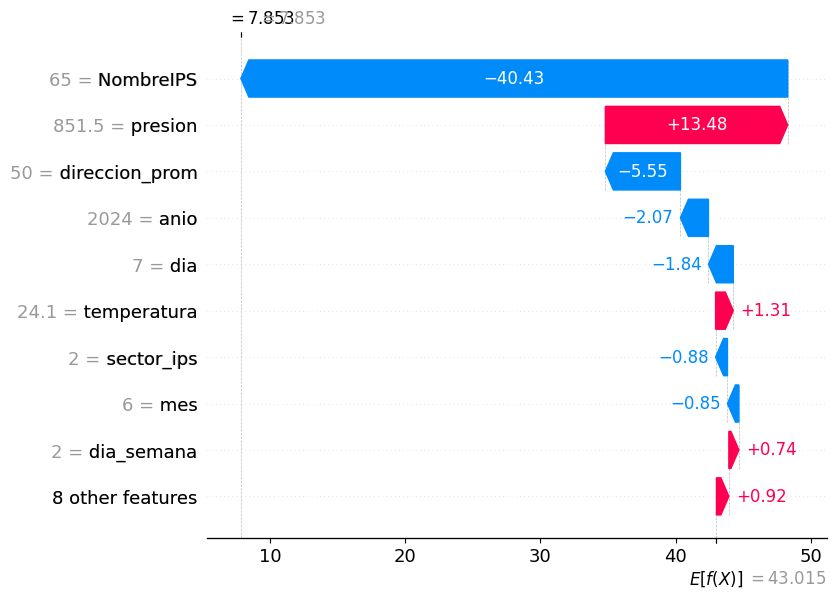

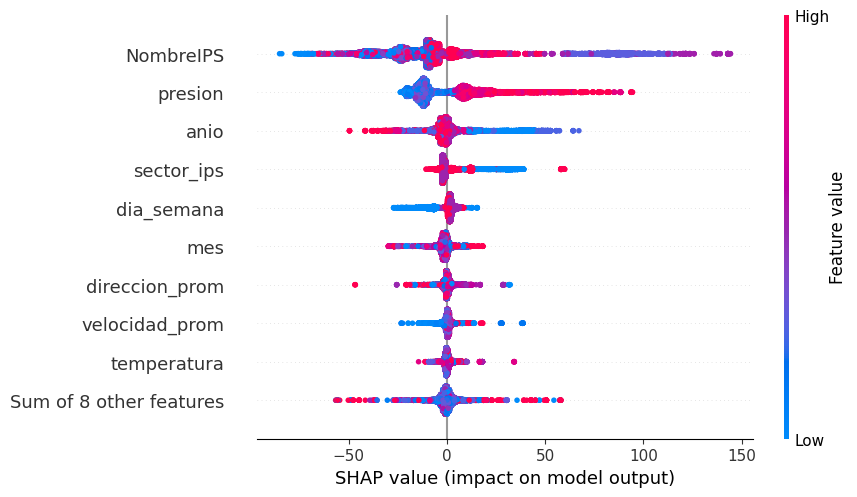

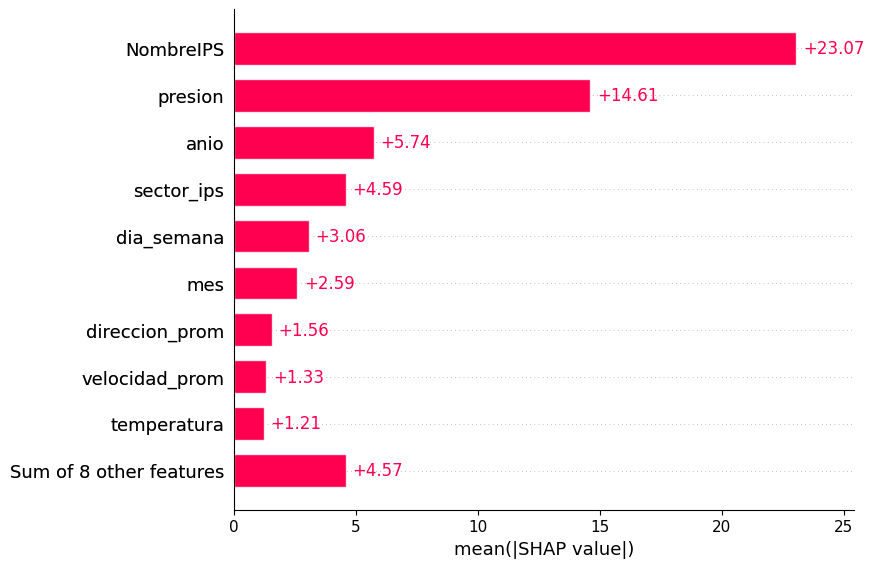

In [ ]:
# Separar los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Entrenar el modelo XGBoost
xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = xgb_model.predict(X_test)

# Crear un explainer para el modelo
explainer = shap.Explainer(xgb_model)

# Obtener las contribuciones SHAP para el conjunto de prueba
shap_values = explainer(X_test)

# Visualizar las contribuciones para una predicción individual
shap.plots.waterfall(shap_values[0], max_display=10)

# Visualizar las contribuciones para todas las predicciones
shap.plots.beeswarm(shap_values, max_display=10)

# Visualizar las contribuciones promedio para cada variable
shap.plots.bar(shap_values, max_display=10)

Se usa Lime para poder identificar y seleccionar variables

In [ ]:
# Convertir los datos de entrenamiento y prueba a NumPy arrays
X_train_np = X_train.values if isinstance(X_train, pd.DataFrame) else X_train
X_test_np = X_test.values if isinstance(X_test, pd.DataFrame) else X_test

# Crear un explainer LIME para el conjunto de datos
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,  # Datos de entrenamiento como NumPy array
    mode="regression",  # Modo de regresión
    feature_names=X.columns,  # Nombres de las columnas
    categorical_features=[X.columns.get_loc("NombreIPS")],  # Índice de la columna categórica
    discretize_continuous=True  # Discretizar variables continuas
)

# Seleccionar un ejemplo del conjunto de prueba

for i in range(5):
# Explicar la predicción para el ejemplo seleccionado
    explicacion = lime_explainer.explain_instance(
        data_row=X_test_np[i],
        predict_fn=xgb_model.predict,  # Función de predicción del modelo
        num_features=10  # Número de características a mostrar
    )

# Mostrar la explicación en un gráfico
explicacion.show_in_notebook()

# Guardar la explicación en un archivo HTML
explicacion.save_to_file("data/analytics/lime_explicacion_nombreIPS.html")

Mirar más explciación con Lime

In [ ]:
resultados = []

for i in range(50):
    exp =  lime_explainer.explain_instance(X_test.iloc[i].values, xgb_model.predict, num_features=10)
    resultados.extend(exp.as_list())

df_exp = pd.DataFrame(resultados, columns=["Feature", "impact"])
importancia_promedio = df_exp.groupby("Feature")['impact'].mean().sort_values(key=abs, ascending=False)
importancia_promedio

Feature
NombreIPS=31               71.9006
NombreIPS=66              -30.4204
NombreIPS=33              -29.8918
presion > 850.35           29.2283
NombreIPS=11              -24.8197
                            ...   
15.00 < dia <= 23.00        0.9584
p1 <= 0.01                  0.3643
1.00 < estacion <= 2.00     0.2768
NombreIPS=22                0.1879
estacion <= 1.00            0.0827
Name: impact, Length: 80, dtype: float64

importancia de las variables

In [ ]:
importancia_xgb = pd.Series(xgb_model.feature_importances_, index=X.columns).sort_values(ascending=False)
importancia_xgb

sector_ips        0.3970
presion           0.1913
anio              0.1399
NombreIPS         0.1033
dia_semana        0.0415
mes               0.0406
festivo           0.0145
p1                0.0140
direccion_prom    0.0119
pm25              0.0106
temperatura       0.0102
velocidad_prom    0.0082
dia               0.0078
humedad           0.0075
edad              0.0018
estacion          0.0000
comuna            0.0000
dtype: float32

In [ ]:
top_vars = importancia_xgb.abs().sort_values(ascending=False).head(15).index.tolist()

X_train_reducido = X_train[top_vars]
X_test_reducido = X_test[top_vars]
xgb_model_reducido = XGBRegressor(random_state=42)
xgb_model_reducido.fit(X_train_reducido, y_train)
y_pred_reducido = xgb_model_reducido.predict(X_test_reducido)
r2_reducido = r2_score(y_test, y_pred_reducido)
print("R2 de la reducción de dimensiones:", r2_reducido)

R2 de la reducción de dimensiones: 0.9871271848678589


De acuerdo con las validaciones con PCA, RandomForest Regressor, Lime, Shape Values.

Podemos concluir que el modelo nos puede rendir con 4 variables que son NombreIPS, mes, anio, presion

## 10) Evaluación Final de los modelos

Modelo XGBoosting

In [ ]:
dataset = datosEstudio.copy()
dataset.head(2)


,edad,anio,dia,mes,sector_ips,NombreIPS,estacion,atenciones_por_dia,pm25,dia_semana,festivo,temperatura,humedad,presion,p1,velocidad_prom,direccion_prom,comuna
0,0.6583,0.00,0.6667,0.0909,0.5,0.5513,0.5,0.2243,0.4703,1.0,0.0,0.189,0.8248,0.2250,0.2316,0.4568,0.7359,0.5
1,0.7333,0.75,0.1667,0.7273,1.0,0.3974,1.0,0.2991,0.1339,0.5,0.0,0.918,0.1061,0.7027,0.0000,0.2593,0.3415,0.0


Division de los datos y uso del modelo ya no teniendo las otras valores

Mean Squared Error (MSE): 0.00039125028409303284
Root Mean Squared Error (RMSE): 0.01978004762615684
R-squared (R2): 0.9779977460831134


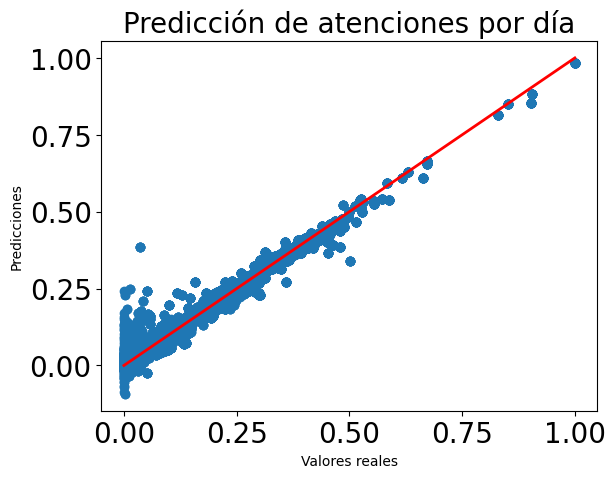

In [ ]:
X = dataset.drop(['atenciones_por_dia', 'festivo','edad', 'temperatura','velocidad_prom','direccion_prom', 
                  "humedad","pm25", "dia" ,"p1", "dia_semana", "comuna", "estacion","sector_ips"], axis=1)
y = dataset['atenciones_por_dia']
# Separar datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Definir el modelo
modelXGB = XGBRegressor()
# Entrenar el modelo
modelXGB.fit(X_train, y_train)
# Predecir valores
y_pred = modelXGB.predict(X_test)
# Calcular el error cuadr�tico medio

#Metricas del modelo SVM
from sklearn.metrics import mean_absolute_error


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
#Metricas mae
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')
# Graficar la predicción vs el valor real
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='L�nea de referencia')  # L�nea de referencia
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title('Predicción de atenciones por día')
plt.show()


Validación de sobre ajsute

In [ ]:
# Predicciones en el conjunto de entrenamiento
y_train_pred = modelXGB.predict(X_train)

# Calcular el error cuadr�tico medio en entrenamiento
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

# Imprimir las m�tricas para el conjunto de entrenamiento
print(f'Mean Squared Error (MSE) en entrenamiento: {mse_train}')
print(f'Root Mean Squared Error (RMSE) en entrenamiento: {rmse_train}')
print(f'R-squared (R2) en entrenamiento: {r2_train}')

Mean Squared Error (MSE) en entrenamiento: 0.000351272957419463
Root Mean Squared Error (RMSE) en entrenamiento: 0.018742277274105806
R-squared (R2) en entrenamiento: 0.9806712474045189


Light Gradient Boosting

In [ ]:
dataset = datosEstudio.copy()
dataset.head(2)

,edad,anio,dia,mes,sector_ips,NombreIPS,estacion,atenciones_por_dia,pm25,dia_semana,festivo,temperatura,humedad,presion,p1,velocidad_prom,direccion_prom,comuna
0,0.6583,0.00,0.6667,0.0909,0.5,0.5513,0.5,0.2243,0.4703,1.0,0.0,0.189,0.8248,0.2250,0.2316,0.4568,0.7359,0.5
1,0.7333,0.75,0.1667,0.7273,1.0,0.3974,1.0,0.2991,0.1339,0.5,0.0,0.918,0.1061,0.7027,0.0000,0.2593,0.3415,0.0


División datos y uso del modelo

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 338
[LightGBM] [Info] Number of data points in the train set: 66989, number of used features: 4
[LightGBM] [Info] Start training from score 0.098336
Mean Squared Error (MSE): 0.00024407851669324272
Root Mean Squared Error (RMSE): 0.015623012407767034
R-squared (R2): 0.9862740610849887


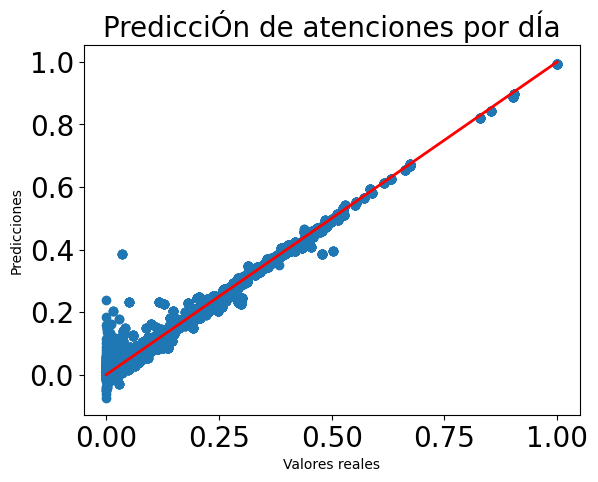

In [ ]:
X = dataset.drop(['atenciones_por_dia', 'festivo','edad', 'temperatura','velocidad_prom','direccion_prom', 
                  "humedad","pm25", "dia" ,"p1", "dia_semana", "comuna", "estacion","sector_ips"], axis=1)
y = dataset['atenciones_por_dia']
# Separar datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#Usar modelo LGBM
lgbm = LGBMRegressor(n_estimators=1000, learning_rate=0.05, num_leaves=32, random_state=42)

lgbm.fit(X_train, y_train)

# Predecir sobre datos de prueba

y_pred = lgbm.predict(X_test)
# Evaluar el modelo
#Metricas del modelo SVM
from sklearn.metrics import mean_absolute_error


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
#Metricas mae
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')
# Graficar la predicci�n vs el valor real
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='L�nea de referencia')  # L�nea de referencia
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title('PredicciÓn de atenciones por dÍa')
plt.show()

Validación para saber que no haya sobreAjuste del modelo

In [ ]:
# Predicciones en el conjunto de entrenamiento
y_train_pred = lgbm.predict(X_train)

# Calcular el error cuadr�tico medio en entrenamiento
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

# Imprimir las m�tricas para el conjunto de entrenamiento
print(f'Mean Squared Error (MSE) en entrenamiento: {mse_train}')
print(f'Root Mean Squared Error (RMSE) en entrenamiento: {rmse_train}')
print(f'R-squared (R2) en entrenamiento: {r2_train}')


Mean Squared Error (MSE) en entrenamiento: 0.00021789044310659362
Root Mean Squared Error (RMSE) en entrenamiento: 0.014761112529433329
R-squared (R2) en entrenamiento: 0.9880106043497735


Random Forest Regressor

In [ ]:
dataset = datosEstudio.copy()
dataset.head(2)

,edad,anio,dia,mes,sector_ips,NombreIPS,estacion,atenciones_por_dia,pm25,dia_semana,festivo,temperatura,humedad,presion,p1,velocidad_prom,direccion_prom,comuna
0,0.6583,0.00,0.6667,0.0909,0.5,0.5513,0.5,0.2243,0.4703,1.0,0.0,0.189,0.8248,0.2250,0.2316,0.4568,0.7359,0.5
1,0.7333,0.75,0.1667,0.7273,1.0,0.3974,1.0,0.2991,0.1339,0.5,0.0,0.918,0.1061,0.7027,0.0000,0.2593,0.3415,0.0


División de los datos y uso del modelo

Mean Squared Error (MSE): 0.0001065577715524418
Root Mean Squared Error (RMSE): 0.010322682381650702
R-squared (R2): 0.9940076435932838


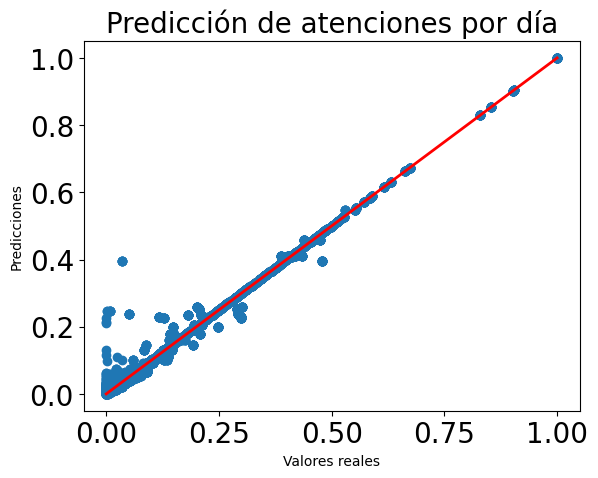

In [ ]:
X = dataset.drop(['atenciones_por_dia', 'festivo','edad', 'temperatura','velocidad_prom','direccion_prom', 
                  "humedad","pm25", "dia" ,"p1", "dia_semana", "comuna", "estacion","sector_ips"], axis=1)
y = dataset['atenciones_por_dia']
# Separar datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#Uso del modelo de random forest regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predecir con los datos de prueba

y_pred = rf_model.predict(X_test)

# Evaluar el modelo
#Metricas del modelo SVM
from sklearn.metrics import mean_absolute_error


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
#Metricas mae
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')
# Graficar la predicci�n vs el valor real
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='L�nea de referencia')  # L�nea de referencia
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title('Predicción de atenciones por día')
plt.show()


Verifiación de sobre Ajuste del modelo

In [ ]:
# Predicciones en el conjunto de entrenamiento
y_train_pred = rf_model.predict(X_train)

# Calcular el error cuadr�tico medio en entrenamiento
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

# Imprimir las m�tricas para el conjunto de entrenamiento
print(f'Mean Squared Error (MSE) en entrenamiento: {mse_train}')
print(f'Root Mean Squared Error (RMSE) en entrenamiento: {rmse_train}')
print(f'R-squared (R2) en entrenamiento: {r2_train}')

Mean Squared Error (MSE) en entrenamiento: 7.387326116470572e-05
Root Mean Squared Error (RMSE) en entrenamiento: 0.00859495556502218
R-squared (R2) en entrenamiento: 0.9959351326132148


Tabla de los resultados de los modelos usados ya sin variables relevantes para la predicción

In [ ]:
#Se crea un dataframe y se define las columnas
metrics_df = pd.DataFrame(columns=['Modelo', 'R²', 'MSE', 'RMSE', 'MAE'])
# Diccionario para almacenar las predicciones por modelo
pred_dict = {}
# Lista de modelos entrenados
models = {
    'Modelo Xgboost': modelXGB,
    'Modelo Light Gradient': lgbm,
    'Modelo Random Forest': rf_model
}

# Evaluar cada modelo
for model_name, model in models.items():
    # Hacer predicciones
    y_pred = model.predict(X_test)

    
    # Calcular las métricas
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Crear un DataFrame para las métricas del modelo actual
    model_metrics = pd.DataFrame([{
        'Modelo': model_name,
        'R²': r2,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae
    }])
    
    # Concatenar el DataFrame actual con el DataFrame de métricas
    metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)
    # Almacenar las predicciones en el diccionario con una clave que seria el nombre del modelo
    pred_dict[f'y_pred_{model_name}'] = y_pred

# Mostrar la tabla de métricas
print(metrics_df)



C:\Users\USER\AppData\Local\Temp\ipykernel_21212\597904037.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)


                  Modelo      R²     MSE    RMSE     MAE
0         Modelo Xgboost  0.9780  0.0004  0.0198  0.0126
1  Modelo Light Gradient  0.9863  0.0002  0.0156  0.0097
2   Modelo Random Forest  0.9940  0.0001  0.0103  0.0020


Identificar el mejor modelo por menos RMSE

In [ ]:
# Seleccionar el mejor modelo según RMSE
mejor_modelo_row = metrics_df.loc[metrics_df['RMSE'].idxmin()]
mejor_modelo_nombre = mejor_modelo_row['Modelo']
print(f"Mejor modelo según RMSE: {mejor_modelo_nombre}")

Mejor modelo según RMSE: Modelo Random Forest


Obtener las predicciones de ese modelo

In [ ]:
# Obtener las predicciones del mejor modelo desde el diccionario
y_pred_mejor_modelo = pred_dict[f'y_pred_{mejor_modelo_nombre}']
y_pred_mejor_modelo

array([0.02116822, 0.01149533, 0.0085514 , ..., 0.90420561, 0.0817757 ,
       0.04205607])

Graficar predicciones vs valores reales

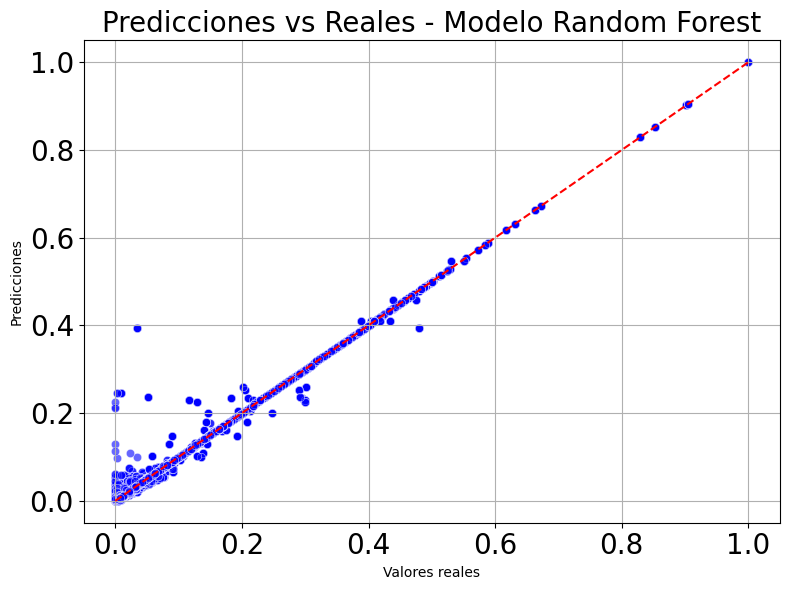

In [ ]:

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_mejor_modelo, color='blue', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')  # línea ideal
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')
plt.title(f'Predicciones vs Reales - {mejor_modelo_nombre}')
plt.grid(True)
plt.tight_layout()
plt.show()

Guardar mejor modelo

In [ ]:
# Obtener el modelo entrenado correspondiente al mejor modelo
mejor_modelo = models[mejor_modelo_nombre]
# Guardar el modelo en un archivo .pkl
joblib.dump(mejor_modelo, 'data/analytics/models/mejor_modelo.pkl')

['data/analytics/models/mejor_modelo.pkl']